In [1]:
import os
os.environ["KMP_DUPLICATE_LIB_OK"]="TRUE"

In [2]:
def find_diagnose(filename):

    with open(filename, "r") as file:
        lines = file.readlines()

    for line in lines:
        tofind = "# Reason for admission: "
        start = len(tofind)
        if tofind in line:
            diagnose = line[start:].strip()
    if diagnose == "n/a":
        return None
    else: #some signals in the dataset don't have a diagnose
        return diagnose

In [3]:
def remove_baselineshift_window(window):
    #compute median
    modes = np.median(window, axis = 1)
    
    to_return = np.zeros_like(window)
    #signal - mode
    for ch, mode in enumerate(modes):
        w_ch = window[ch, :]
        if mode < 0:
            to_return[ch, :] = w_ch - mode
        else:
            to_return[ch, :] = w_ch + mode
        #return
    return to_return

In [4]:
import wfdb

In [5]:
def multichannel_resample(signal, new_lenght):
    nchs = 15
    resampled_signal = np.zeros((new_lenght, nchs))
    for ch in range(nchs):
        resampled_signal[:, ch] = resample(signal[:, ch], new_lenght)
        #print(resampled_signal[:, ch].shape, resample(signal[:, ch], new_fs).shape)
    return resampled_signal

In [6]:
from scipy.signal import butter, lfilter, iirnotch

def bandpass(lowcut, highcut, order=3, fs = 500):
    
    nyq = 0.5 * fs
    low = lowcut / nyq
    high = highcut / nyq
    b, a = butter(order, [low, high], btype='band')
    return b, a

def notch_filter(cutoff, q, fs=500):
    
    nyq = 0.5*fs
    freq = cutoff/nyq
    b, a = iirnotch(freq, q)
    return b, a

def myfilter(lowcut, highcut, powerline, data):
    
    nchs = 12
    filtered_data = np.zeros_like(data)
    for ch in range(nchs):
        ch_data = data[:, ch]
        b, a = bandpass(lowcut, highcut)   
        x = lfilter(b, a, ch_data)
        f, e = notch_filter(powerline, 30)
        z = lfilter(f, e, x) 
        filtered_data[:, ch] = (x)
    return filtered_data

In [7]:
import os 
import numpy as np 
from scipy.signal import resample

cwd = os.getcwd() + os.sep + "ptb-diagnostic-ecg-database-1.0.0"
patients = [filename for filename in os.listdir(cwd) if "patient" in filename]
y_patients = {}
signals = {}
map_signals = {} #i: patient/record
all_signals = []
notfiltered_signals = []
n = len(patients)
j = 0
for i, patient in enumerate(patients):
    
    print(i+1, "/", n, end="\r")
    patient_dir = cwd + os.sep + patient + os.sep
    records = [filename for filename in os.listdir(patient_dir) if ".dat" in filename]
    y_patients[patient] = {}
    signals[patient] = {}
    for record in records:
        filename = record[:-4] + ".hea"
        hea_file = patient_dir + filename
        diagnose = find_diagnose(hea_file)
        if diagnose is None:
            continue
        y_patients[patient][record] = diagnose
        path_record = patient_dir + record
        signal, fields = wfdb.rdsamp(path_record[:-4])
        signal = multichannel_resample(signal, int(signal.shape[0]/2)) #from 1000hz to 500hz
        notfiltered_signals.append(signal)
        filtered_signal = myfilter(0.5, 100, 50, signal)
        signals[patient][record] = filtered_signal
        all_signals.append(filtered_signal)
        map_signals[j] = patient + "/" + record    
        j += 1
        
all_signals = np.array(all_signals)
notfiltered_signals = np.array(notfiltered_signals)

C:\Users\Utente\AppData\Local\Temp\ipykernel_29020\2518655677.py:38: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  all_signals = np.array(all_signals)
C:\Users\Utente\AppData\Local\Temp\ipykernel_29020\2518655677.py:39: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  notfiltered_signals = np.array(notfiltered_signals)


In [8]:
y_all = [diagnose for patient, temp in y_patients.items() for record, diagnose in temp.items()]
uqs, cnts = np.unique(y_all, return_counts = True)
for i, uq in enumerate(uqs):
    cnt = cnts[i]
    print(uq, ":", cnt)

Bundle branch block : 17
Cardiomyopathy : 17
Dysrhythmia : 16
Healthy control : 80
Heart failure (NYHA 2) : 1
Heart failure (NYHA 3) : 1
Heart failure (NYHA 4) : 1
Hypertrophy : 7
Myocardial infarction : 368
Myocarditis : 4
Palpitation : 1
Stable angina : 2
Unstable angina : 1
Valvular heart disease : 6


In [9]:
def binarize(y_int, map_y):

    y_bin = y_int.copy()
    map_bin = {}
    for i, target in map_y.items():
        if target == "Healthy control": #sostituire con NORMAL/CONTROL
            y_bin[y_bin == i] = 0
            map_bin[target] = 0
        else:
            y_bin[y_bin == i] = 1
            map_bin[target] = 1
    return y_bin, map_bin

In [10]:
def prepare_target(y_all):

    y_int = y_all.copy()
    y_int = np.array(y_int)
    map_y = {}
    uqs = np.unique(y_all)
    for i, uq in enumerate(uqs):
        map_y[i] = uq
        y_int[y_int == uq] = i

    y_int = y_int.astype(int)
    y_bin, map_bin = binarize(y_int, map_y)

    return y_int, y_bin, map_y, map_bin


In [11]:
y_int, y_bin, map_y, map_bin = prepare_target(y_all)
y_bin

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,

In [12]:
np.unique(y_int, return_counts = True)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13]),
 array([ 17,  17,  16,  80,   1,   1,   1,   7, 368,   4,   1,   2,   1,
          6], dtype=int64))

In [13]:
map_bin

{'Bundle branch block': 1,
 'Cardiomyopathy': 1,
 'Dysrhythmia': 1,
 'Healthy control': 0,
 'Heart failure (NYHA 2)': 1,
 'Heart failure (NYHA 3)': 1,
 'Heart failure (NYHA 4)': 1,
 'Hypertrophy': 1,
 'Myocardial infarction': 1,
 'Myocarditis': 1,
 'Palpitation': 1,
 'Stable angina': 1,
 'Unstable angina': 1,
 'Valvular heart disease': 1}

In [14]:
import torch 
from EcgStuffs.src.dpnet import dpnet_loader, conf

In [15]:
if torch.cuda.is_available():
    model = dpnet_loader.load() #load auto encoder model
else:
    model = dpnet_loader.load_cpu()

In [16]:
model

DPNet(
  (encoder): Encoder(
    (conv_0): Conv2d(1, 15, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (activation0): Tanh()
    (conv_1): Conv2d(15, 30, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2), bias=False)
    (activation1): Tanh()
    (block_0): EncoderBlock(
      (conv2d_in): Conv2d(30, 30, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (activation_in): Tanh()
      (batch_norm_in): BatchNorm2d(30, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (dropout_in): Dropout(p=0.2, inplace=False)
      (conv2d_out): Conv2d(30, 45, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (skip_con): Sequential(
        (0): Conv2d(30, 45, kernel_size=(1, 1), stride=(2, 2), bias=False)
        (1): BatchNorm2d(45, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (batch_norm_out): BatchNorm2d(45, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (activation_o

In [17]:
len(y_bin)  

522

In [18]:
len(notfiltered_signals), len(all_signals)

(522, 522)

In [19]:
all_signals[0].shape, notfiltered_signals[0].shape

((19200, 15), (19200, 15))

In [20]:
idx_normal = np.argwhere(y_bin == 0)
idx_ab = np.argwhere(y_bin == 1)
x_normal = all_signals[idx_normal].flatten()
x_normal_nf = notfiltered_signals[idx_normal].flatten()
y_normal = y_bin[idx_normal].flatten()
x_ab = all_signals[idx_ab].flatten()
x_ab_nf = notfiltered_signals[idx_ab].flatten()
y_ab =  y_bin[idx_ab].flatten()

In [21]:
x_normal.shape, y_normal.shape, x_ab.shape, y_ab.shape

((80,), (80,), (442,), (442,))

In [22]:
x_normal[0].shape

(57600, 15)

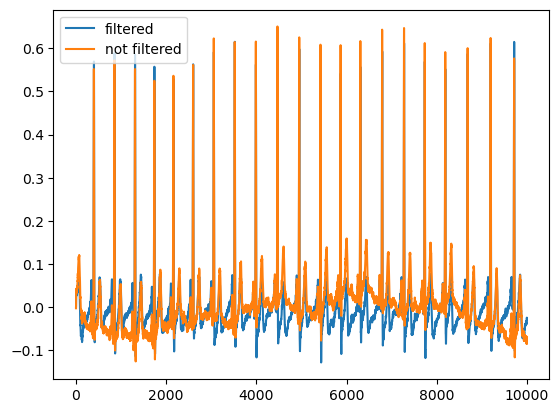

In [23]:
import matplotlib.pyplot as plt 
plt.plot(x_normal[0][:10000, 0], label = "filtered")
plt.plot(x_normal_nf[0][:10000, 0], label = "not filtered")
plt.legend()

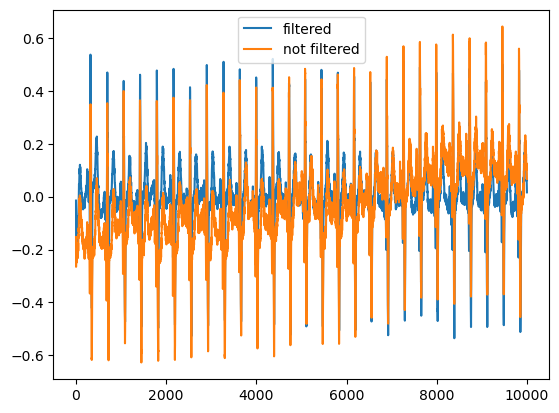

In [24]:
plt.plot(x_ab[0][:10000, 0], label = "filtered")
plt.plot(x_ab_nf[0][:10000, 0], label = "not filtered")
plt.legend()

In [25]:
from sklearn.model_selection import train_test_split

#x_train, x_testn, y_train, y_test_n = train_test_split(x_normal, y_normal, test_size = 0.2)
#x_train.shape, x_testn.shape, y_train.shape, y_test_n.shape

((64,), (16,), (64,), (16,))

In [589]:
#torch.save(x_train, "x_train.pt")
#torch.save(x_testn, "x_testn.pt")
#torch.save(y_train, "y_train.pt")
#torch.save(y_test_n, "y_test_n.pt")

In [ ]:
torch.save(x_train, "x_train.pt")
torch.save(x_testn, "x_testn.pt")
torch.save(y_train, "y_train.pt")
torch.save(y_test_n, "y_test_n.pt")

In [620]:
"""
bool = True
for i, x in enumerate(x_train):
    temp_x = temp[i]
    for ch in range(15):
        temp_x_ch = temp_x[:, ch]
        x_ch = x[:, ch]
        if not (x_ch == temp_x_ch).all():
            bool = False
            break
bool
"""
x_train = torch.load("x_train.pt")
x_testn = torch.load("x_testn.pt")
y_train = torch.load("y_train.pt")
y_test_n = torch.load("y_test_n.pt")

True

In [341]:
from sklearn.metrics import roc_curve, auc 

def plot_roc_curve(y, y_pred):
    # calculate the fpr, tpr, AUC and plot the ROC curve 
    '''
    input: 
    y: array-like contenente i valori dell'attributo target
    y_pred: array-like contenente le predizioni dell'attributo target
    output: None
    
    '''
    y = np.array(y)       #cast array-like in numpy array
    y_pred = np.array(y_pred)
    labels = np.unique(y)
    fpr, tpr, threshold = roc_curve(y, y_pred)
    #print(fpr, tpr)
    roc_auc = round(auc(fpr, tpr), 4)
    
    plt.title('ROC curve')
    plt.plot(fpr, tpr, 'b', label = 'AUC {}'.format(roc_auc))
    plt.legend(loc = 'lower right')
    plt.plot(labels, labels,'r--')
    plt.xlim([-0.05, 1])
    plt.ylim([0, 1.05])
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    plt.show()

In [342]:
def plot_cm(cm):
    
    import matplotlib.pyplot as plt
    import seaborn as sns
    import pandas as pd
    import numpy as np

    sns.set(style='white')
    fig, ax = plt.subplots(figsize=(12, 8))
    sns.heatmap(np.eye(2), annot=cm, fmt='g', annot_kws={'size': 50},
                cmap=sns.color_palette(['tomato', 'palegreen'], as_cmap=True), cbar=False,
                yticklabels=['Normal', 'Abnormal'], xticklabels=['Normal', 'Abnormal'], ax=ax)
    ax.xaxis.tick_top()
    ax.xaxis.set_label_position('top')
    ax.tick_params(labelsize=20, length=0)

    ax.set_title('Seaborn Confusion Matrix with labels', size=24, pad=20)
    ax.set_xlabel('Predicted Values', size=20)
    ax.set_ylabel('Actual Values', size=20)

    additional_texts = ['(True Positive)', '(False Negative)', '(False Positive)', '(True Negative)']
    for text_elt, additional_text in zip(ax.texts, additional_texts):
        ax.text(*text_elt.get_position(), '\n' + additional_text, color=text_elt.get_color(),
                ha='center', va='top', size=24)
    plt.tight_layout()
    plt.show()

In [ ]:
from sklearn.metrics import confusion_matrix, roc_auc_score, classification_report

def validate_model(y_trues, y_preds):

    TP = 0
    FP = 0
    TN = 0
    FN = 0
    idxs_missclassified = []

    for i, y_true in enumerate(y_trues):

        y_pred = y_preds[i]

        if y_true == 1: #"N":
            if y_pred == y_true:
                TN += 1
            else:
                FP += 1
                idxs_missclassified.append(i)

        else:
            if y_pred == y_true:
                TP += 1 
            else:
                FN += 1
            idxs_missclassified.append(i)
        
            
    acc = (TP+TN)/(TP+TN+FP+FN)
    if FN + TP != 0:
        TPR = TP/(FN+TP) #sensitivity 
        FNR = FN/(FN+TP)
        recall = TPR
    else: 
        TPR = None
        FNR = None 
        recall = None
    
    if TN+FP != 0:
        
        TNR = TN/(TN+FP) #specificity
        FPR = FP/(TN+FP)
    else: 
        TNR = None
        FPR = None 
    
    if TP+FP != 0:
        precision = TP/(TP+FP)
    else:
        precision = None
    
    if precision != 0 and recall != 0:
        f1 = 2*(1/((1/precision)+(1/recall)))
    else:
        f1 = None 
        
    cm = confusion_matrix(y_trues, y_preds)
    cr = classification_report(y_trues, y_preds)
    auc = roc_auc_score(y_trues, y_preds)
    metrics = {
        "accuracy": acc,
        "f1": f1,
        "cm": cm,
        "sensitivity": TPR,
        "specificity": TNR,
        "missed allarm rate": FPR,
        "false allarm rate": FNR,
        "auc_score": auc,
        "precision": precision,
        "recall": recall,
        "report": cr,
        "predictions": y_preds,
        "idxs_missclassified": idxs_missclassified
    }
    plot_roc_curve(y_trues, y_preds)
    plot_cm(cm)
    return metrics, "Accuracy: {} \n F1 score: {} \n Sensitivity: {} \n Specificity: {} \n ROC AUC score: {} \n False Allarm Rate: {}, Missed Allarm Rate: {} \n Confusion Matrix: \n {} \n Classification Report: \n {} \n".format(acc, f1, TPR, TNR, auc, FNR, FPR, cm, cr)

In [28]:
from EcgStuffs.src.windows.WindowingUtils import sliding_window
from IPython.display import clear_output

In [29]:
map_signals

{0: 'patient001/s0010_re.dat',
 1: 'patient001/s0014lre.dat',
 2: 'patient001/s0016lre.dat',
 3: 'patient002/s0015lre.dat',
 4: 'patient003/s0017lre.dat',
 5: 'patient004/s0020are.dat',
 6: 'patient004/s0020bre.dat',
 7: 'patient005/s0021are.dat',
 8: 'patient005/s0021bre.dat',
 9: 'patient005/s0025lre.dat',
 10: 'patient005/s0031lre.dat',
 11: 'patient005/s0101lre.dat',
 12: 'patient006/s0022lre.dat',
 13: 'patient006/s0027lre.dat',
 14: 'patient006/s0064lre.dat',
 15: 'patient007/s0026lre.dat',
 16: 'patient007/s0029lre.dat',
 17: 'patient007/s0038lre.dat',
 18: 'patient007/s0078lre.dat',
 19: 'patient008/s0028lre.dat',
 20: 'patient008/s0037lre.dat',
 21: 'patient008/s0068lre.dat',
 22: 'patient009/s0035_re.dat',
 23: 'patient010/s0036lre.dat',
 24: 'patient010/s0042lre.dat',
 25: 'patient010/s0061lre.dat',
 26: 'patient011/s0039lre.dat',
 27: 'patient011/s0044lre.dat',
 28: 'patient011/s0049lre.dat',
 29: 'patient011/s0067lre.dat',
 30: 'patient012/s0043lre.dat',
 31: 'patient012/s

In [30]:
index_testn = []
for x in x_testn:
    for i, signal in enumerate(all_signals):
        if np.array_equal(x, signal):
            index_testn.append(i)
            break
index_testn

[450,
 453,
 449,
 462,
 465,
 486,
 357,
 448,
 343,
 456,
 500,
 461,
 508,
 391,
 442,
 507]

In [31]:
index_trainn = []
for x in x_train:
    for i, signal in enumerate(all_signals):
        if np.array_equal(x, signal):
            index_trainn.append(i)
            break
index_trainn

[452,
 376,
 469,
 383,
 362,
 451,
 454,
 498,
 361,
 483,
 446,
 334,
 499,
 380,
 475,
 441,
 501,
 388,
 503,
 478,
 467,
 458,
 392,
 425,
 381,
 407,
 466,
 457,
 509,
 335,
 375,
 474,
 468,
 447,
 473,
 369,
 389,
 386,
 464,
 316,
 459,
 472,
 370,
 460,
 502,
 390,
 331,
 490,
 487,
 387,
 382,
 463,
 317,
 329,
 455,
 379,
 330,
 377,
 395,
 393,
 371,
 396,
 489,
 406]

In [32]:
index_testab = []
for x in x_ab:
    for i, signal in enumerate(all_signals):
        if np.array_equal(x, signal):
            index_testab.append(i)
            break
index_testab

[0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 43,
 44,
 45,
 46,
 47,
 48,
 49,
 50,
 51,
 52,
 53,
 54,
 55,
 56,
 57,
 58,
 59,
 60,
 61,
 62,
 63,
 64,
 65,
 66,
 67,
 68,
 69,
 70,
 71,
 72,
 73,
 74,
 75,
 76,
 77,
 78,
 79,
 80,
 81,
 82,
 83,
 84,
 85,
 86,
 87,
 88,
 89,
 90,
 91,
 92,
 93,
 94,
 95,
 96,
 97,
 98,
 99,
 100,
 101,
 102,
 103,
 104,
 105,
 106,
 107,
 108,
 109,
 110,
 111,
 112,
 113,
 114,
 115,
 116,
 117,
 118,
 119,
 120,
 121,
 122,
 123,
 124,
 125,
 126,
 127,
 128,
 129,
 130,
 131,
 132,
 133,
 134,
 135,
 136,
 137,
 138,
 139,
 140,
 141,
 142,
 143,
 144,
 145,
 146,
 147,
 148,
 149,
 150,
 151,
 152,
 153,
 154,
 155,
 156,
 157,
 158,
 159,
 160,
 161,
 162,
 163,
 164,
 165,
 166,
 167,
 168,
 169,
 170,
 171,
 172,
 173,
 174,
 175,
 176,
 177,
 178,
 179,
 180,
 181,
 182,
 183,
 184,


In [33]:
#map windows 
windows_train = []
windows_normal = []
map_windows = {}
y_all_patient = {}
k = 0

for i, signal in enumerate(x_train):
    print("Train", i+1, "/", len(x_train), end="\r")
    signal = signal.T
    patient = map_signals[index_trainn[i]]
    y_all_patient[patient] = 0
    map_windows[patient] = []
    windows = sliding_window(signal[:, 3000:], 2000, 1500) #provare qui overlap: nel train, NEL TEST SENZA OVERLAP
    for window in windows:
        windows_train.append(window)
        windows_normal.append(window)
        map_windows[patient].append(k)
        k+=1
        
clear_output()
windows_test = []
y_test = []
y_test_patient = {}
map_windows_test = {}
j = 0
for i, signal in enumerate(x_testn):
    patient = map_signals[index_testn[i]]
    map_windows_test[patient] = []
    map_windows[patient] = []
    print("Test", i+1, "/", len(x_testn), end="\r")
    signal = signal.T
    y_test_patient[patient] = 0
    y_all_patient[patient] = 0
    windows = sliding_window(signal[:, 3000:], 2000, 1500)
    for window in windows:
        windows_test.append(window)
        windows_normal.append(window)
        y_test.append(0)
        map_windows_test[patient].append(j)
        map_windows[patient].append(k)
        j+=1
        k+=1
        
for i, signal in enumerate(x_ab):
    print("Test", i+1, "/", len(x_ab), end="\r")
    patient = map_signals[index_testab[i]]
    map_windows_test[patient] = []
    map_windows[patient] = []
    y_all_patient[patient] = 1
    signal = signal.T
    y_test_patient[patient] = 1
    windows = sliding_window(signal[:, 3000:], 2000, 1500)
    for window in windows:
        windows_test.append(window)
        y_test.append(1)
        map_windows_test[patient].append(j)
        map_windows[patient].append(k)
        j+=1
        k+=1

In [34]:
windows_train[0].shape

(15, 2000)

In [35]:
len(windows_train), len(windows_test)

(2398, 15982)

In [36]:
len(windows_train) + len(windows_test)

18380

In [37]:
all_windows = []
all_y = []

for window in windows_train:
    all_windows.append(window)
    all_y.append(0)

for i, window in enumerate(windows_test):
    y = y_test[i]
    all_windows.append(window)
    all_y.append(y)

In [38]:
len(all_windows), len(all_y)

(18380, 18380)

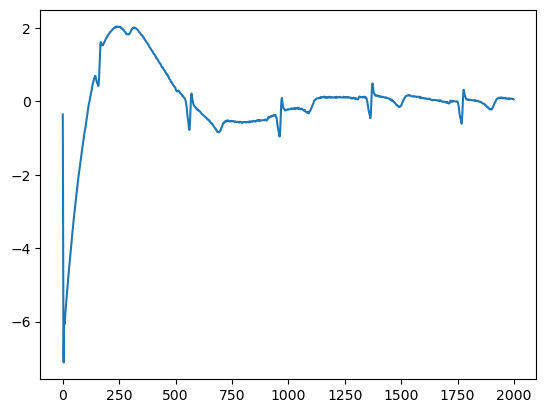

In [39]:
plt.plot(signal[2, :2000])

In [40]:
len(windows_train)

2398

In [41]:
#y_test_patient

In [42]:
#map_windows

In [43]:
len(y_test)

15982

In [44]:
len(windows_train), len(windows_test)

(2398, 15982)

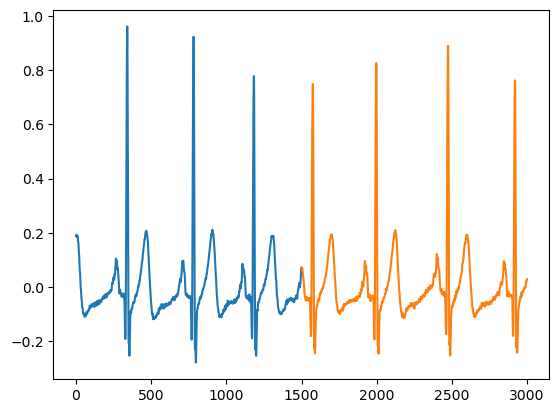

In [45]:
plt.plot(np.arange(0, 1500), windows_train[0][0, :1500])
plt.plot(np.arange(1500, 3000), windows_train[1][0, :1500])

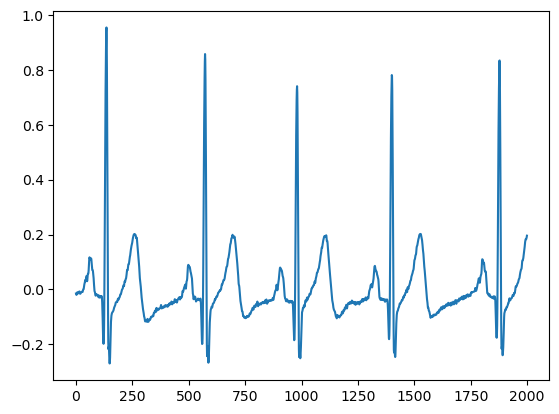

In [46]:
plt.plot(windows_train[7][0, :])

In [47]:
windows_train[0].shape

(15, 2000)

In [48]:
n = len(windows_train)
temp = torch.zeros((n, 15, 2000))
for i, window in enumerate(windows_train):
    temp[i] = torch.from_numpy(window)
windows_train = temp
windows_train.shape

torch.Size([2398, 15, 2000])

In [49]:
n = len(windows_test)
temp = torch.zeros((n, 15, 2000))
for i, window in enumerate(windows_test):
    temp[i] = torch.from_numpy(window)
windows_test = temp
windows_test.shape

torch.Size([15982, 15, 2000])

In [50]:
n = len(all_windows)
temp = torch.zeros((n, 15, 2000))
for i, window in enumerate(all_windows):
    print(i+1, "/", n, end="\r")
    temp[i] = torch.from_numpy(window)
all_windows = temp
all_windows.shape

torch.Size([18380, 15, 2000])

In [51]:
n = len(windows_normal)
temp = torch.zeros((n, 15, 2000))
for i, window in enumerate(windows_normal):
    print(i+1, "/", n, end="\r")
    temp[i] = torch.from_numpy(window)
windows_normal = temp
windows_normal.shape

torch.Size([3003, 15, 2000])

In [52]:
device = "cuda" if torch.cuda.is_available else "cpu"
device

'cuda'

In [53]:
class ECGDataset():
  
    def __init__(self, data):
        self.data = data

    def __len__(self):
        return len(self.data)
    
    def __getitem__(self, index):
        sample = self.data[index]
        return sample

In [54]:
windows_train = torch.unsqueeze(windows_train, dim = 1).to(device)
windows_train.shape

torch.Size([2398, 1, 15, 2000])

In [55]:
windows_normal = torch.unsqueeze(windows_normal, dim=1).to(device)
windows_normal.shape

torch.Size([3003, 1, 15, 2000])

In [56]:
#train_dataset = ECGDataset(windows_train)
train_dataset = ECGDataset(windows_normal)

In [58]:
import collections

from pytorch_lightning.loggers import Logger 
from pytorch_lightning.loggers.logger import rank_zero_experiment
from pytorch_lightning.utilities import rank_zero_only

class HistoryLogger(Logger):
    def __init__(self):
        super().__init__()

        self.history = collections.defaultdict(list) # copy not necessary here
        self.log = collections.defaultdict(list) 
        self.loss = collections.defaultdict(list) 
        self.epoch = 1
        self.metric_names = []
        # The defaultdict in contrast will simply create any items that you try to access

    @property
    def name(self):
        return "Logger"

    @property
    def version(self):
        return "1.0"

    @property
    @rank_zero_experiment
    def experiment(self):
        pass

    @rank_zero_only
    def log_metrics(self, metrics, step):
        
        for metric_name, metric_value in metrics.items():
            if metric_name != 'epoch':
                if metric_name not in self.metric_names:
                    self.metric_names.append(metric_name)
                self.history["temp"+metric_name].append(metric_value)
            
    def log_end_epoch(self): 

        for metric_name in self.metric_names:
            epoch_metric_values = self.history["temp"+metric_name]
            mean_metric = np.mean(epoch_metric_values)
            self.log[metric_name].append(mean_metric)
            self.loss[self.epoch] = epoch_metric_values
            self.epoch += 1
    
    def log_hyperparams(self, params):
        pass

In [59]:
from pytorch_lightning import LightningModule

class ECGADLightning(LightningModule):
    
    def __init__(self, model, lr):
        super().__init__()
        self.model = model
        self.lr = lr
        self.metric = torch.nn.MSELoss()
        self.optimizer = torch.optim.Adam(self.parameters(), lr=self.lr)
    def forward(self, x):
        return self.model(x)
    
    def configure_optimizers(self):
        return self.optimizer 
    
    def training_step(self, batch, batch_idx):
        x = batch
        x_hat = self.model(x)
        loss = self.metric(x, x_hat)
        self.log_dict({"loss": loss}, sync_dist=True)
        return loss

    def validation_step(self, batch, batch_idx):
        self._shared_eval(batch, batch_idx, "val")

    def test_step(self, batch, batch_idx):
        self._shared_eval(batch, batch_idx, "test")

    def _shared_eval(self, batch, batch_idx, prefix):
        x = batch
        x_hat = self.model(x)
        loss = self.metric(x, x_hat)
        self.log(f"{prefix}_loss", loss)
        
    def on_train_epoch_end(self):
        
        self.logger.log_end_epoch() 

In [60]:
train_dataloader = torch.utils.data.DataLoader(train_dataset, 
                                               batch_size = 4,#1
                                               shuffle = True
                                              )

In [62]:
device

'cuda'

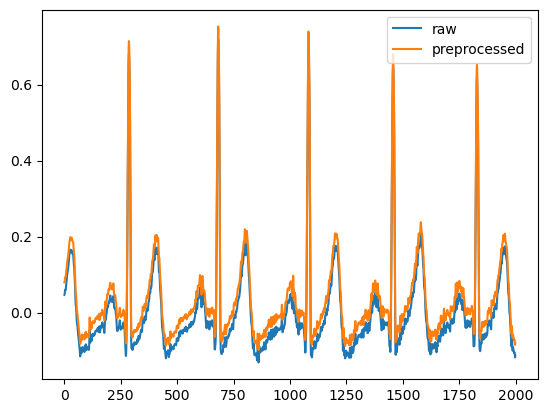

In [61]:
patient = "patient251/s0486_re.dat"
w = map_windows[patient]
windows = all_windows[w]
window = windows[0]
baselinezero_window = remove_baselineshift_window(window)
plt.plot(window[0, :], label = "raw")
plt.plot(baselinezero_window[0, :], label = "preprocessed")
plt.legend()

In [142]:
from pytorch_lightning.trainer import Trainer
if torch.cuda.is_available():
    model = dpnet_loader.load() #load auto encoder model
    model = model.to(device)
else:
    model = dpnet_loader.load_cpu()
 
epochs = 500 #3000
logger = HistoryLogger()
lightningmodel = ECGADLightning(model, lr = 0.0001)#0.00001
trainer = Trainer(accelerator='gpu', precision=16, max_epochs = epochs, logger= logger, log_every_n_steps = 1, default_root_dir="lightning_logs/")#100
trainer.fit(lightningmodel, train_dataloader)

Using 16bit native Automatic Mixed Precision (AMP)
Using 16bit native Automatic Mixed Precision (AMP)
GPU available: True (cuda), used: True
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
HPU available: False, using: 0 HPUs
E:\Users\Utente\anaconda3\lib\site-packages\pytorch_lightning\trainer\configuration_validator.py:108: PossibleUserWarning:

You defined a `validation_step` but have no `val_dataloader`. Skipping val loop.

E:\Users\Utente\anaconda3\lib\site-packages\pytorch_lightning\callbacks\model_checkpoint.py:604: UserWarning:

Checkpoint directory lightning_logs\Logger\1.0\checkpoints exists and is not empty.

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name   | Type    | Params
-----------------------------------
0 | model  | DPNet   | 540 K 
1 | metric 

Training: 0it [00:00, ?it/s]

`Trainer.fit` stopped: `max_epochs=3000` reached.
`Trainer.fit` stopped: `max_epochs=3000` reached.


In [199]:
import gc

In [331]:
def plot_latent_space(model, datas, labels):
    
    from sklearn.decomposition import PCA 
    from sklearn.manifold import TSNE
    import plotly.graph_objects as go 
    
    map_labels = {0: "Normal", 1: "Abnormal"}
    fig = go.FigureWidget() 

    labels = np.array(labels)
    colors = ["red", "green"]
    uq_labels = np.unique(labels)[::-1]
    for j, label in enumerate(uq_labels):
        
        torch.cuda.empty_cache()
        gc.collect()
        color = colors[j]
        labels_n = []
        first_component = []
        second_component = []
        idx_label = np.argwhere(labels == label)
        data_label = datas[idx_label]
        data_label = data_label.to("cpu")
        data_label = torch.squeeze(data_label, dim = 1)
        #print(data_label.shape)
        latent_space = model.encoder(data_label)  
        trnsf = PCA(n_components=2)
        print(latent_space.cpu().detach().numpy().shape)
        components = trnsf.fit_transform(latent_space.cpu().detach().numpy())
        print(components.shape)
        first_component = components[:, 0]
        second_component = components[:, 1]
        #third_component = components[:, 2]
        labels_n.append(label)
        #fig.add_trace(go.Scatter3d(x = first_component, y = second_component, z = third_component, mode  = "markers", marker_color = color, legendgroup = map_labels[label.item()]))
        fig.add_trace(go.Scatter(x = first_component, y = second_component, mode  = "markers", marker_color = color, name = map_labels[label.item()], legendgroup = map_labels[label.item()]))
        
    #fig.update_layout(xaxis_title = "First component", yaxis_title = "Second component", zaxis_title = "Third component")
    return fig 

(15377, 128)
(15377, 2)
(605, 128)
(605, 2)


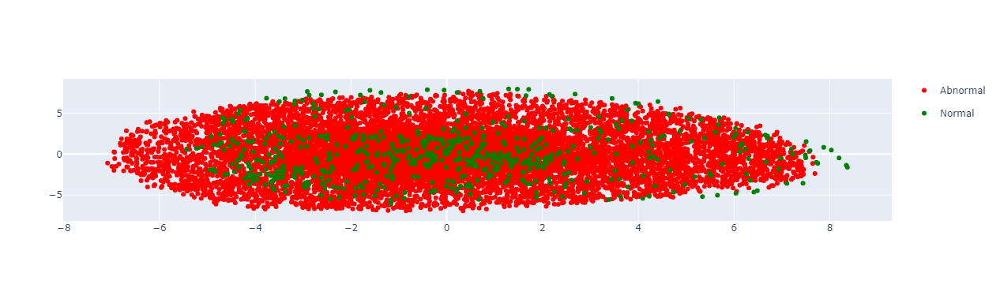

In [332]:
fig = plot_latent_space(model.to("cpu"), windows_test, y_test)
fig.show()

In [623]:
model = model.to(device)

In [203]:
torch.save(model.state_dict(), "model_1407.pt")

In [624]:
if torch.cuda.is_available():
    model = dpnet_loader.load() #load auto encoder model
else:
    model =  dpnet_loader.load_cpu()
model.load_state_dict(torch.load("model_1407.pt"))
model = model.to(device)

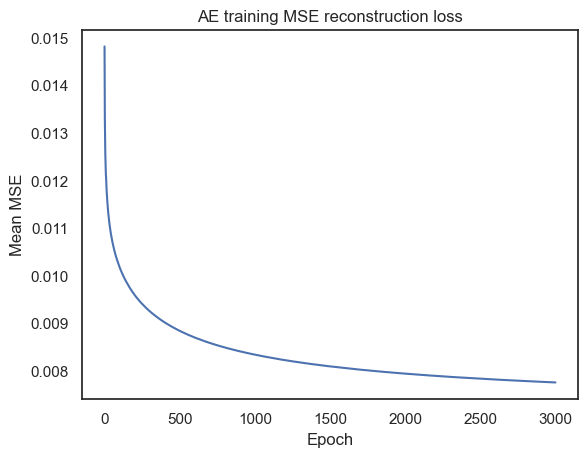

In [330]:
losses = logger.log["loss"]
fig = plt.Figure(figsize=(20, 10))
plt.title("AE training MSE reconstruction loss")
epochs_plot = np.arange(0, epochs, 1)
plt.plot(epochs_plot, losses)
plt.xlabel("Epoch")
plt.ylabel("Mean MSE")
plt.savefig("loss.png")

In [206]:
losses

[0.014809485531093357,
 0.013832836160461074,
 0.013310921416877113,
 0.012984476050364471,
 0.012764748538684314,
 0.012557620397379107,
 0.012419380240063687,
 0.01228236767192732,
 0.012173794350916287,
 0.012101180075832734,
 0.012082113563200922,
 0.01199015524662879,
 0.01191679732443813,
 0.01184516172711354,
 0.011780577377303343,
 0.011722429353370518,
 0.011669566508625037,
 0.011618609636514125,
 0.011572778297915748,
 0.011530423382130983,
 0.011484704935713817,
 0.011444703023565055,
 0.01140722577597978,
 0.01137024497254609,
 0.011334765413689232,
 0.01130271799697641,
 0.011270749908136838,
 0.011239101384470191,
 0.011210269253178244,
 0.011183174019964652,
 0.011154089349950757,
 0.011126984975162147,
 0.011099772693594065,
 0.011075725581705147,
 0.011051947349958463,
 0.011028313493423075,
 0.011005386376594112,
 0.01098467765567993,
 0.010963015192673842,
 0.010942144260114585,
 0.010921598572259725,
 0.010898869660441214,
 0.01087929328825083,
 0.01086237491744738

In [625]:
torch.save(losses, "losses_training.pt")

In [626]:
model.eval()

DPNet(
  (encoder): Encoder(
    (conv_0): Conv2d(1, 15, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (activation0): Tanh()
    (conv_1): Conv2d(15, 30, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2), bias=False)
    (activation1): Tanh()
    (block_0): EncoderBlock(
      (conv2d_in): Conv2d(30, 30, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (activation_in): Tanh()
      (batch_norm_in): BatchNorm2d(30, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (dropout_in): Dropout(p=0.2, inplace=False)
      (conv2d_out): Conv2d(30, 45, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (skip_con): Sequential(
        (0): Conv2d(30, 45, kernel_size=(1, 1), stride=(2, 2), bias=False)
        (1): BatchNorm2d(45, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (batch_norm_out): BatchNorm2d(45, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (activation_o

In [627]:
windows_test.shape

torch.Size([15982, 1, 15, 2000])

In [212]:
windows_test = torch.unsqueeze(windows_test, dim=1)
windows_test.shape

torch.Size([15982, 1, 15, 2000])

In [628]:
model = model.to(device)

In [629]:
"""
if torch.cuda.is_available():
    model = dpnet_loader.load() #load auto encoder model
    model = model.to(device)
else:
    model = dpnet_loader.load_cpu()
"""

from torch.functional import F 

fs = 500 
nchs = 15 
interval2 = 1500
interval = 2000
reconstruction_errors = []
n = windows_test.shape[0]
for i, batch_data in enumerate(windows_test): 
    
    batch_data = batch_data.to(device)
    #print(batch_data.shape)
    batch_data = torch.unsqueeze(batch_data, dim = 0).to(device)
    #batch_data = torch.unsqueeze(batch_data, dim = 0)
    #print(batch_data.shape)
    reconstruction_all = np.zeros((nchs, interval2))        

    with torch.no_grad():

        reconstruction = model(batch_data)
        reconstruction_error = F.mse_loss(reconstruction[0, 0, :, :interval2], batch_data[0, 0, :, :interval2]).item()
        print(i+1, "/", n, "Recon error:", round(reconstruction_error, 6), end = "\r")
        reconstruction_errors.append(reconstruction_error)
        recon_np = (reconstruction[0, 0, :, :interval2].cpu().detach().numpy()).reshape(1, nchs, interval2)
        reconstruction_all[:, :] = recon_np[0, :, :interval2]

        torch.cuda.empty_cache()

In [630]:
len(reconstruction_errors)

15982

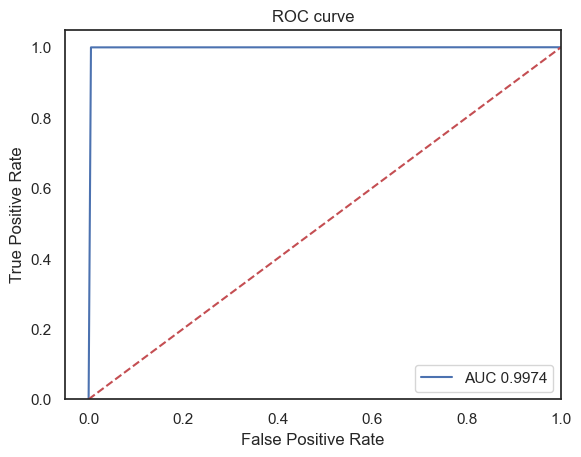

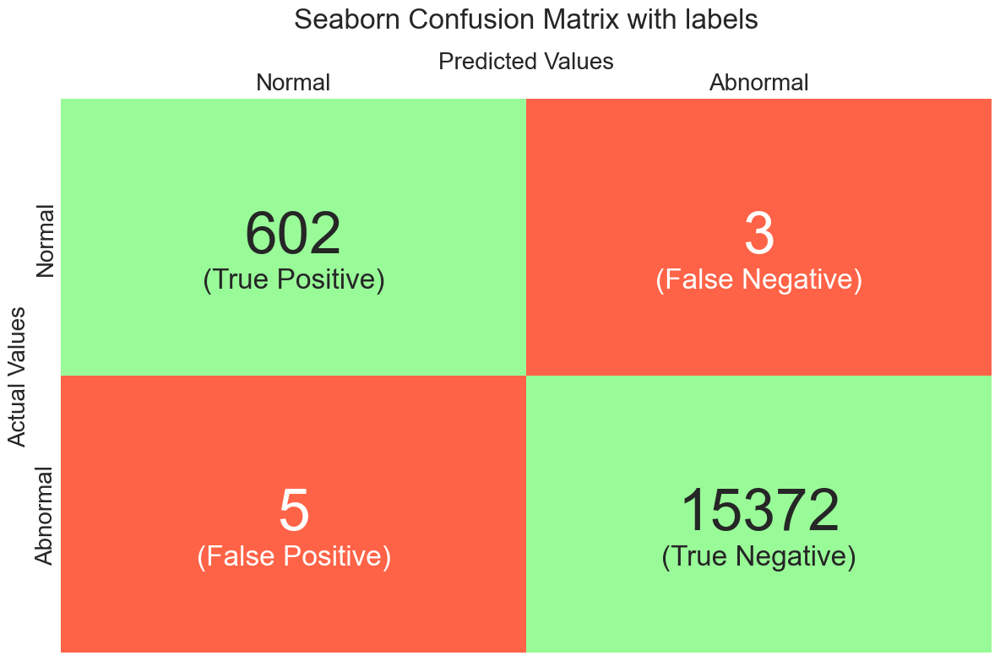

In [631]:
from time import sleep
best_th = 0.0
best_auc = 0.0
normal_mse = []
anomalous_mse = []
count_decr = 0 

thresholds = np.arange(0.00255, 0.1, 0.000005)
for j, threshold in enumerate(thresholds):
    print(threshold)
    y_preds = []
    for i, recon_error in enumerate(reconstruction_errors):

        if j == 0:
            if y_test[i] == 0:
                normal_mse.append(recon_error)
            else:
                anomalous_mse.append(recon_error)

        if recon_error > threshold:
            y_preds.append(1)
        else:
            y_preds.append(0)
                
        y = y_test[i]
        
    sleep(0.5)
    clear_output(wait = True)
    metrics, to_print = validate_model(y_test, y_preds)
    auc_score = metrics["auc_score"]
    if auc_score > best_auc:
        best_th = threshold
        best_auc = auc_score
    if auc_score < best_auc:
        count_decr += 1
    if count_decr >= 20: 
        break
    print(to_print)

In [349]:
best_th, best_auc

(0.002599999999999998, 0.9974556289660903)

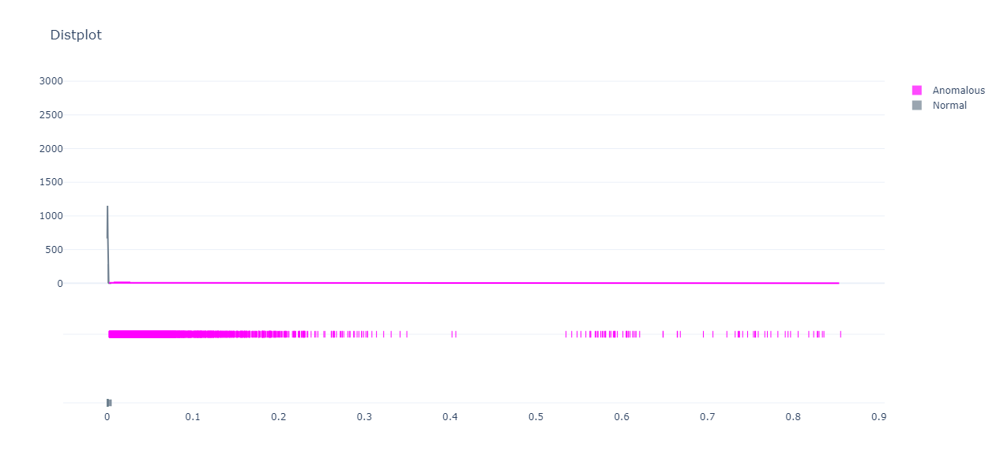

In [350]:
import plotly.figure_factory as ff
import numpy as np


group_labels = ['Normal', 'Anomalous']

colors = ['slategray', 'magenta']

# Create distplot with curve_type set to 'normal'
fig = ff.create_distplot([normal_mse, anomalous_mse], group_labels, bin_size=.0,
                         curve_type='normal', # override default 'kde'
                         colors=colors)
fig.update_layout(title_text='Distplot', template = "plotly_white", height = 600, width = 1200)
fig.show()

In [351]:
channels = ["i", "ii", "iii", "aVR", "aVL", "aVF", "v1", "v2" ,"v3", "v4", "v5", "v6", "x", "y", "z"]

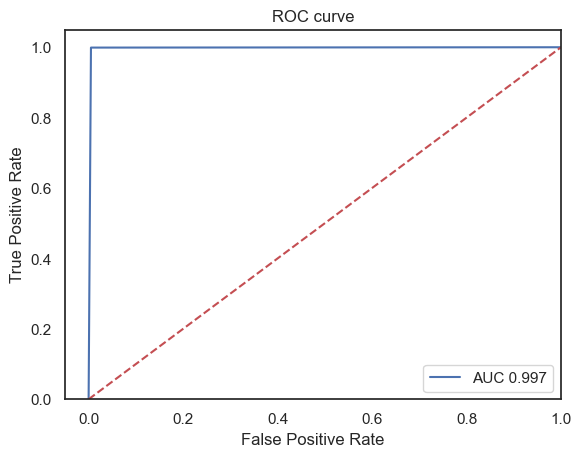

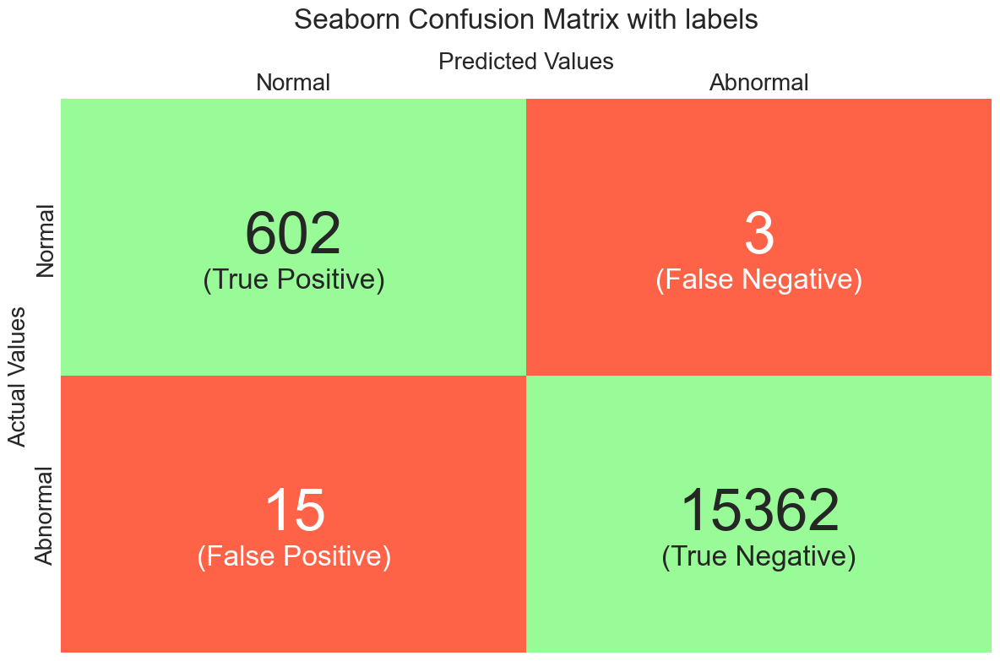

Accuracy: 0.9988737329495683 
 F1 score: 0.9852700490998362 
 Sensitivity: 0.9950413223140496 
 Specificity: 0.9990245171359823 
 ROC AUC score: 0.9970329197250161 
 False Allarm Rate: 0.0049586776859504135, Missed Allarm Rate: 0.0009754828640176887 
 Confusion Matrix: 
 [[  602     3]
 [   15 15362]] 
 Classification Report: 
               precision    recall  f1-score   support

           0       0.98      1.00      0.99       605
           1       1.00      1.00      1.00     15377

    accuracy                           1.00     15982
   macro avg       0.99      1.00      0.99     15982
weighted avg       1.00      1.00      1.00     15982
 



In [556]:
from time import sleep

y_preds = []
for i, recon_error in enumerate(reconstruction_errors):
    
    if recon_error > best_th:
        y_preds.append(1)
    else:
        y_preds.append(0)
                
    y = y_test[i]
        
metrics, to_print = validate_model(y_test, y_preds)
auc_score = metrics["auc_score"]
print(to_print)

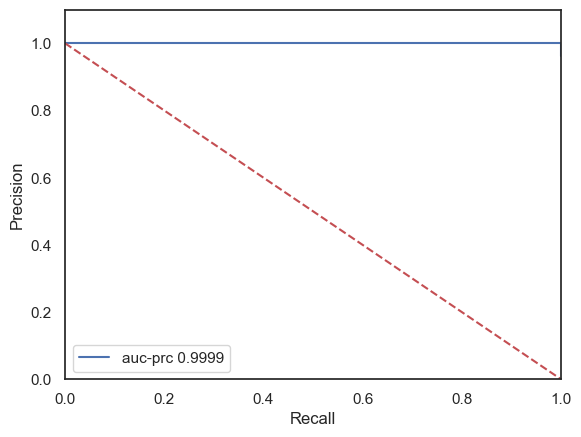

In [353]:
from sklearn.metrics import PrecisionRecallDisplay, precision_recall_curve

prec, recall, _ = precision_recall_curve(y_test, y_preds)
auc_pr = auc(recall, prec)
pr_display = PrecisionRecallDisplay(precision=prec, recall=recall).plot(label="auc-prc {}".format(round(auc_pr, 4)))
plt.plot([0, 1], [1, 0], "--r")
plt.xlim([0, 1])
plt.ylim([0, 1.1])
plt.legend()

In [354]:
def isSignalAnomalous(patient, windows, threshold, test, n_anomalies_th = 1, device = "cuda", verbose = True, model = model):

    reconstruction_errors = []
    reconstruction_windows = torch.zeros_like((windows))
    interval = 1500
    interval2 = 2000
        
    nchs = 15
    n_record = windows.shape[0]*interval
    reconstruction_all = np.zeros((nchs, n_record))
    
    for i, window in enumerate(windows):
        batch_data = torch.unsqueeze(window, dim = 0)
        batch_data = torch.unsqueeze(window, dim = 0)
        batch_data = batch_data.to(device)
        
        if i == 0:
            start = 0
            end = interval
        else:
            start += int(interval)
            end += int(interval) 
        
        #print(i, start, end)
        with torch.no_grad():
            reconstruction = model(batch_data)
            reconstruction_errors.append((F.mse_loss(reconstruction[0, 0, :, :interval], batch_data[0, 0, :, :interval])).item())
            reconstruction_windows[i, :, :] = reconstruction
            torch.cuda.empty_cache()
            if end > n_record:
                reconstruction_all[:, start:n_record] = recon_np[0, :, :interval2-(end-n_record)] #TO FIX START AND END
            else:
                reconstruction_all[:, start:end] = recon_np[0, :, :interval]
                
    predictions = []
    for recon_error in reconstruction_errors:
        if recon_error >= threshold:
            predictions.append(1)
        else:
            predictions.append(0)
            
    uqs, cnts = np.unique(predictions, return_counts = True)
    pred_cnts = {}

    for i, uq in enumerate(uqs):
        cnt = cnts[i]
        pred_cnts[uq] = cnt
    
    pred = 0# Normal
    if 1 in pred_cnts.keys():
        if pred_cnts[1] >= n_anomalies_th:
            pred = 1
    if verbose:
        print("Patient:", patient, "Target:", test,  "Prediction: ", pred, "Windows label:", uqs, "Windows counts:", cnts)
    
    reconstruction_all = torch.from_numpy(reconstruction_all).to(device)
    return reconstruction_all, pred, np.mean(recon_error)

In [355]:
patient = list(map_windows.keys())[500]
w = map_windows[patient]
windows = all_windows[w]
windows = torch.unsqueeze(windows, dim=1)
test = y_all_patient[patient]
recon, pred, mean_rec_error = isSignalAnomalous(patient, windows, best_th, test, n_anomalies_th = 1, device = "cuda", verbose = True)
recon.shape

Patient: patient268/s0505_re.dat Target: 1 Prediction:  1 Windows label: [1] Windows counts: [38]


torch.Size([15, 57000])

In [356]:
map_y_final = {0: "Normal", 1: "Anomalous"}

torch.Size([15, 57000]) torch.Size([15, 57000])


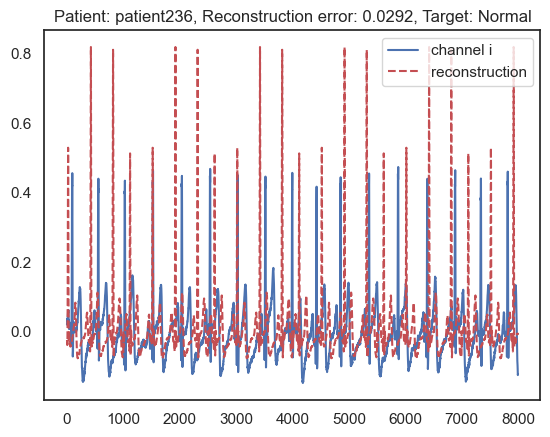

In [357]:
patient_signal = "patient236/s0462_re.dat"
patient = patient_signal.split("/")[0]
signal = patient_signal.split("/")[1]
x = torch.from_numpy(signals[patient][signal].T[:, :recon.shape[-1]]).to(device)
print(x.shape, recon.shape)
reconstruction_error = F.mse_loss(x, recon).item()
y = y_all_patient[patient_signal]
ch = 0
plt.plot(x[ch, 2000:10000].cpu().detach().numpy(), label = "channel {}".format(channels[ch]))
plt.plot(recon[ch, 2000:10000].cpu().detach().numpy(), "--r", label = "reconstruction")
plt.title("Patient: {}, Reconstruction error: {}, Target: {}".format(patient, round(reconstruction_error , 4), map_y_final[y]))
plt.legend()

In [557]:
y_preds_patient = {}
patients_missclassified = []
signals_all = {}
recons_all = {}
recon_error_patients = {}
normal_mse_patient = []
abnormal_mse_patient = []
for i, (patient_signal, w) in enumerate(map_windows_test.items()):
    print(i+1, "/", len(map_windows_test.keys()), end="\r")
    windows = windows_test[w] 
    #windows = torch.squeeze(windows, dim = 1)
    test = y_test_patient[patient_signal]
    recons_signal, pred, recon_error = isSignalAnomalous(patient_signal, windows, best_th, test, n_anomalies_th = 1) 
    recons_all[patient_signal] = recons_signal
    patient = patient_signal.split("/")[0]
    signal = patient_signal.split("/")[1]
    recon_error_patients[patient_signal] = recon_error
    signals_all[patient_signal] = signals[patient][signal]
    y_preds_patient[patient_signal] = pred
    if test != pred:
        patients_missclassified.append(patients)
    if test == 0:
        normal_mse_patient.append(recon_error)
    else:
        abnormal_mse_patient.append(recon_error)

Patient: patient233/s0483_re.dat Target: 0 Prediction:  0 Windows label: [0] Windows counts: [38]
Patient: patient236/s0462_re.dat Target: 0 Prediction:  1 Windows label: [0 1] Windows counts: [36  1]
Patient: patient233/s0482_re.dat Target: 0 Prediction:  0 Windows label: [0] Windows counts: [38]
Patient: patient242/s0471_re.dat Target: 0 Prediction:  0 Windows label: [0] Windows counts: [38]
Patient: patient245/s0474_re.dat Target: 0 Prediction:  0 Windows label: [0] Windows counts: [38]
Patient: patient263/s0499_re.dat Target: 0 Prediction:  0 Windows label: [0] Windows counts: [38]
Patient: patient150/s0287lre.dat Target: 0 Prediction:  1 Windows label: [0 1] Windows counts: [35  2]
Patient: patient233/s0459_re.dat Target: 0 Prediction:  0 Windows label: [0] Windows counts: [38]
Patient: patient131/s0273lre.dat Target: 0 Prediction:  0 Windows label: [0] Windows counts: [37]
Patient: patient237/s0465_re.dat Target: 0 Prediction:  0 Windows label: [0] Windows counts: [38]
Patient: p

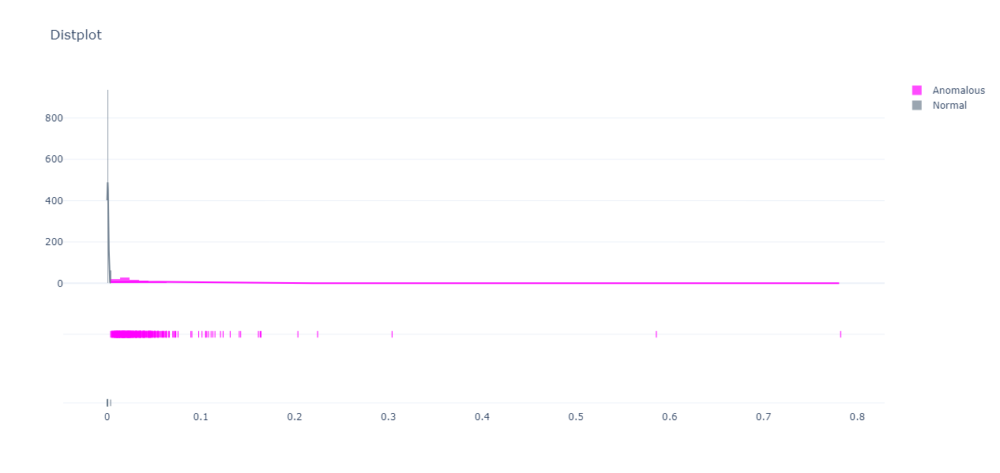

In [226]:
group_labels = ['Normal', 'Anomalous']

colors = ['slategray', 'magenta']

# Create distplot with curve_type set to 'normal'
fig = ff.create_distplot([normal_mse_patient, abnormal_mse_patient], group_labels, bin_size=.0,
                         curve_type='normal', # override default 'kde'
                         colors=colors)
fig.update_layout(title_text='Distplot', template = "plotly_white", height = 600, width = 1200)
fig.show()

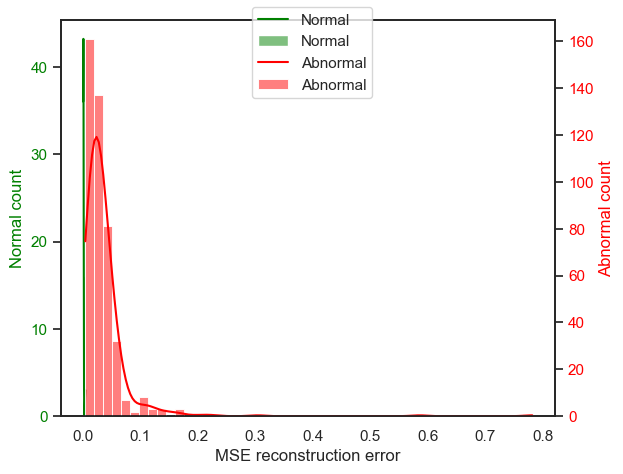

In [426]:
import seaborn as sns 


fig, ax1 = plt.subplots()

ax1.set_xlabel('MSE reconstruction error')
ax1.set_ylabel('Normal count', color="green")
sns.histplot(normal_mse_patient, kde=True,
             bins=1, color = 'green', ax = ax1)
ax1.tick_params(axis='y', labelcolor="green")

ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

ax2.set_ylabel('Abnormal count', color="red")  # we already handled the x-label with ax1
sns.histplot(abnormal_mse_patient, kde=True, 
             bins=50, color = 'red', ax = ax2)
ax2.tick_params(axis='y', labelcolor="red")

fig.tight_layout()  # otherwise the right y-label is slightly clipped
fig.legend(labels = ["Normal", "Normal", "Abnormal", "Abnormal"], loc = "upper center")

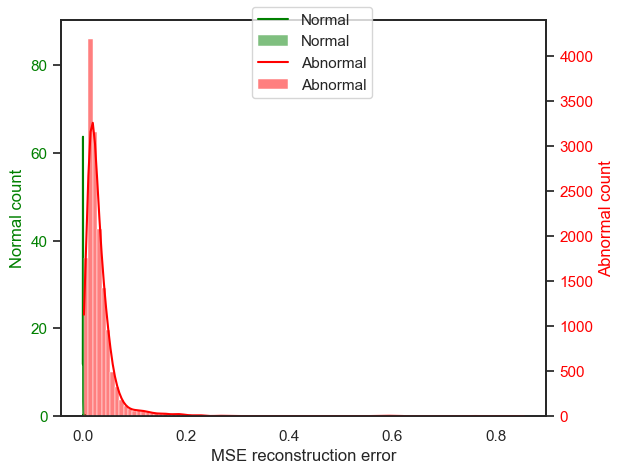

In [427]:
fig, ax1 = plt.subplots()

ax1.set_xlabel('MSE reconstruction error')
ax1.set_ylabel('Normal count', color="green")
sns.histplot(normal_mse, kde=True, 
             bins=100, color = 'green', ax = ax1)
ax1.tick_params(axis='y', labelcolor="green")

ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

ax2.set_ylabel('Abnormal count', color="red")  # we already handled the x-label with ax1
sns.histplot(anomalous_mse, kde=True, 
             bins=100, color = 'red', ax = ax2)
ax2.tick_params(axis='y', labelcolor="red")

fig.tight_layout()  # otherwise the right y-label is slightly clipped
fig.legend(labels = ["Normal", "Normal", "Abnormal", "Abnormal"], loc = "upper center")

Text(0.002699999999999998, 40, 'threshold = 0.0026')

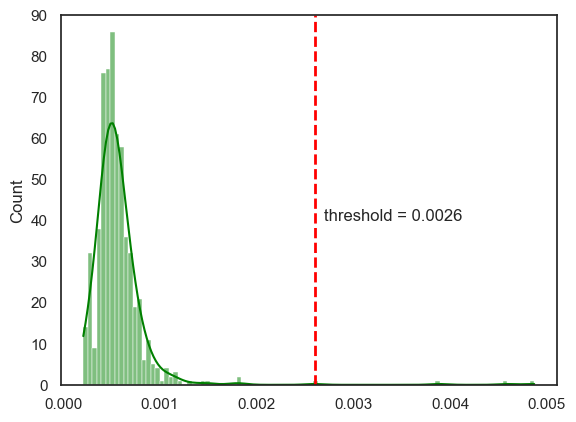

In [458]:
sns.histplot(normal_mse, kde=True, 
             bins=100, color = 'green')
plt.vlines(x = best_th, ymin = 0, ymax = 90, color = "red", linewidth = 2, linestyles = "dashed")
plt.ylim([0, 90])
plt.text(x = best_th + 0.0001, y = 40, s = "threshold = {}".format(round(best_th, 6)))

Text(0.012599999999999998, 4300, 'threshold = 0.0026')

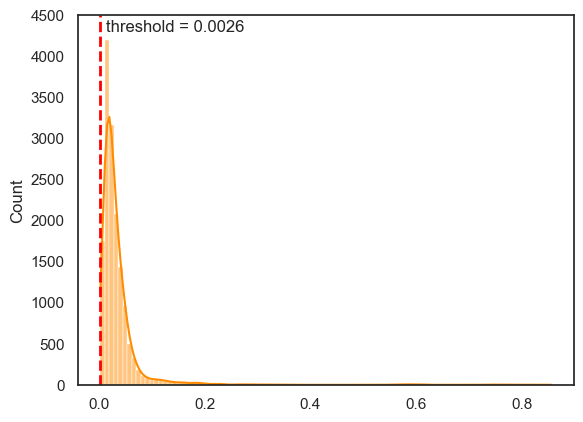

In [468]:
sns.histplot(anomalous_mse, kde=True, 
             bins=100, color = 'darkorange')
plt.vlines(x = best_th, ymin = 0, ymax = 4500, color = "red", linewidth = 2, linestyles = "dashed")
plt.ylim([0, 4500])
plt.text(x = best_th + 0.01, y = 4300, s = "threshold = {}".format(round(best_th, 6)))

In [558]:
y_test_f = []
y_preds_f = []

for patient, test in y_test_patient.items():

    pred = y_preds_patient[patient]
    y_test_f.append(test)
    y_preds_f.append(pred)

In [559]:
len(y_preds_f), len(y_test_f)

(458, 458)

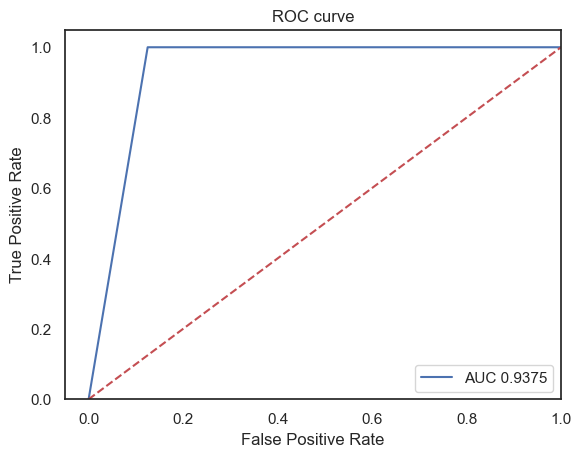

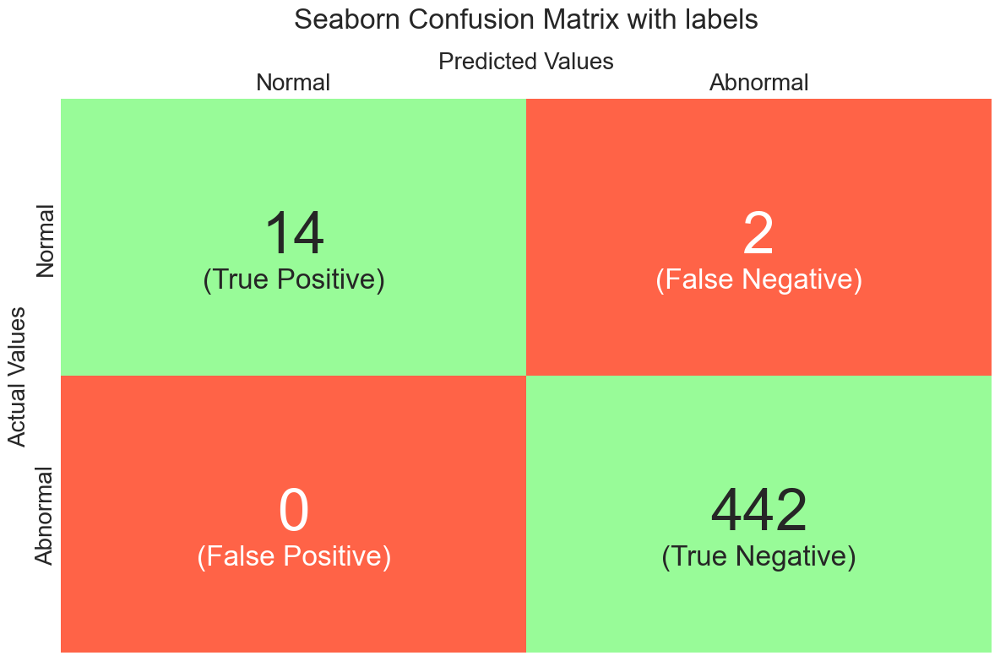

Accuracy: 0.9956331877729258 
 F1 score: 0.9333333333333333 
 Sensitivity: 0.875 
 Specificity: 1.0 
 ROC AUC score: 0.9375 
 False Allarm Rate: 0.125, Missed Allarm Rate: 0.0 
 Confusion Matrix: 
 [[ 14   2]
 [  0 442]] 
 Classification Report: 
               precision    recall  f1-score   support

           0       1.00      0.88      0.93        16
           1       1.00      1.00      1.00       442

    accuracy                           1.00       458
   macro avg       1.00      0.94      0.97       458
weighted avg       1.00      1.00      1.00       458
 



In [471]:
rocauc, to_print = validate_model(y_test_f, y_preds_f)
print(to_print)

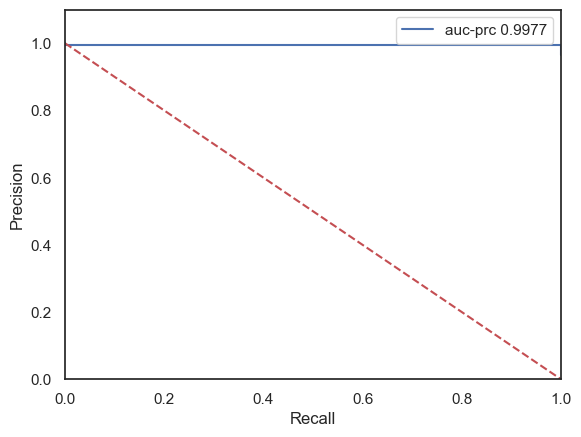

In [472]:
from sklearn.metrics import PrecisionRecallDisplay, precision_recall_curve

prec, recall, _ = precision_recall_curve(y_test_f, y_preds_f)
auc_pr = auc(recall, prec)
pr_display = PrecisionRecallDisplay(precision=prec, recall=recall).plot(label="auc-prc {}".format(round(auc_pr, 4)))
plt.plot([0, 1], [1, 0], "--r")
plt.xlim([0, 1])
plt.ylim([0, 1.1])
plt.legend()

In [473]:
from torch.functional import F 

fs = 500 
nchs = 15 
n_record = 2000
interval2 = 1500
interval = 2000
reconstruction_errors = []
n = all_windows.shape[0]

for i, batch_data in enumerate(all_windows): 
    
    #print(batch_data.shape)
    batch_data = torch.unsqueeze(batch_data, dim = 0).to(device)
    batch_data = torch.unsqueeze(batch_data, dim = 0)
    #print(batch_data.shape)
    reconstruction_all = np.zeros((nchs, n_record))        

    with torch.no_grad():

        reconstruction = model(batch_data)
        reconstruction_error = F.mse_loss(reconstruction[0, 0, :, :interval2], batch_data[0, 0, :, :interval2]).item()
        print(i+1, "/", n, "Recon error:", round(reconstruction_error, 6), end = "\r")
        reconstruction_errors.append(reconstruction_error)
        recon_np = (reconstruction[0, 0, :, :interval].cpu().detach().numpy()).reshape(1, nchs, interval)
        reconstruction_all[:, :] = recon_np[0, :, :interval]

        torch.cuda.empty_cache()

In [474]:
len(reconstruction_errors)

18380

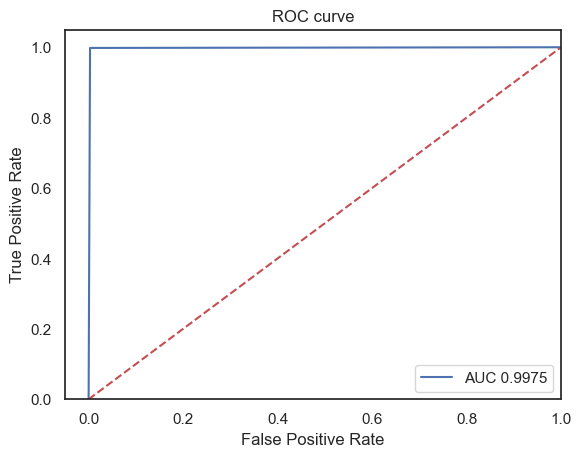

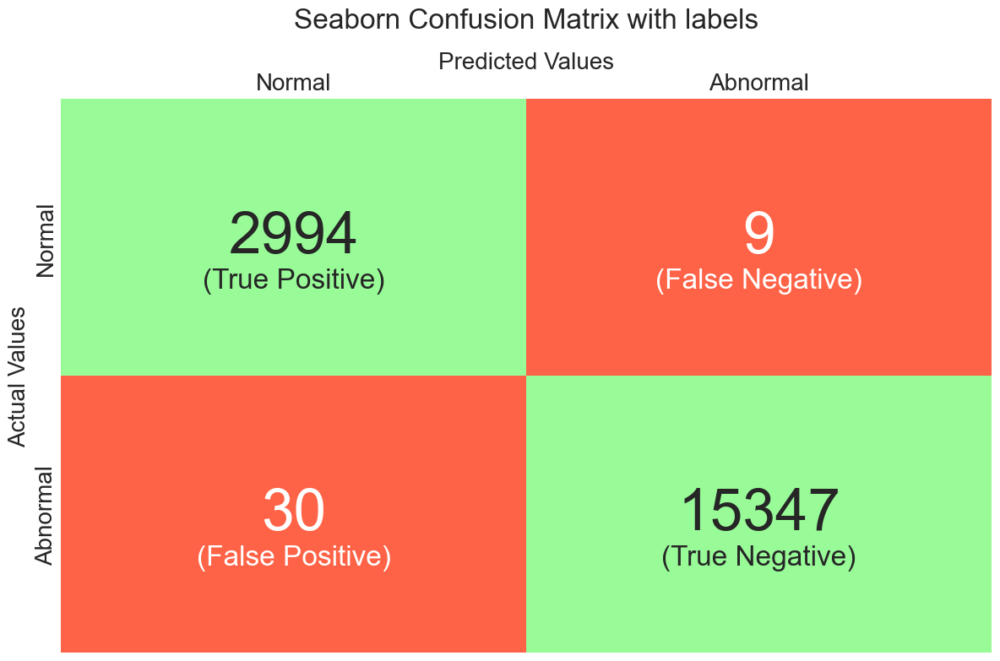

In [475]:
from time import sleep
best_th = 0.0
best_auc = 0.0
normal_mse = []
anomalous_mse = []
count_decr = 0 

thresholds = np.arange(0.001, 0.1, 0.00001)
for j, threshold in enumerate(thresholds):
    print(threshold)
    y_preds = []
    for i, recon_error in enumerate(reconstruction_errors):

        if j == 0:
            if all_y[i] == 0:
                normal_mse.append(recon_error)
            else:
                anomalous_mse.append(recon_error)

        if recon_error > threshold:
            y_preds.append(1)
        else:
            y_preds.append(0)
                
        y = all_y[i]
        
    sleep(0.5)
    clear_output(wait = True)
    metrics, to_print = validate_model(all_y, y_preds)
    auc_score = metrics["auc_score"]
    if auc_score > best_auc:
        best_th = threshold
        best_auc = auc_score
    if auc_score < best_auc:
        count_decr += 1
    if count_decr >= 50: 
        break
    print(to_print)

In [477]:
best_th, best_auc

(0.003290000000000006, 0.9980137570694897)

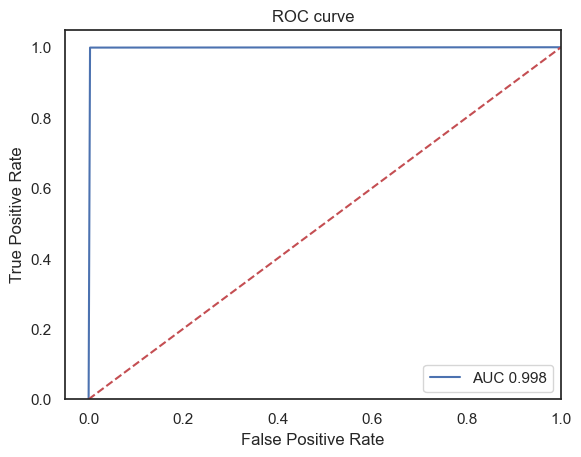

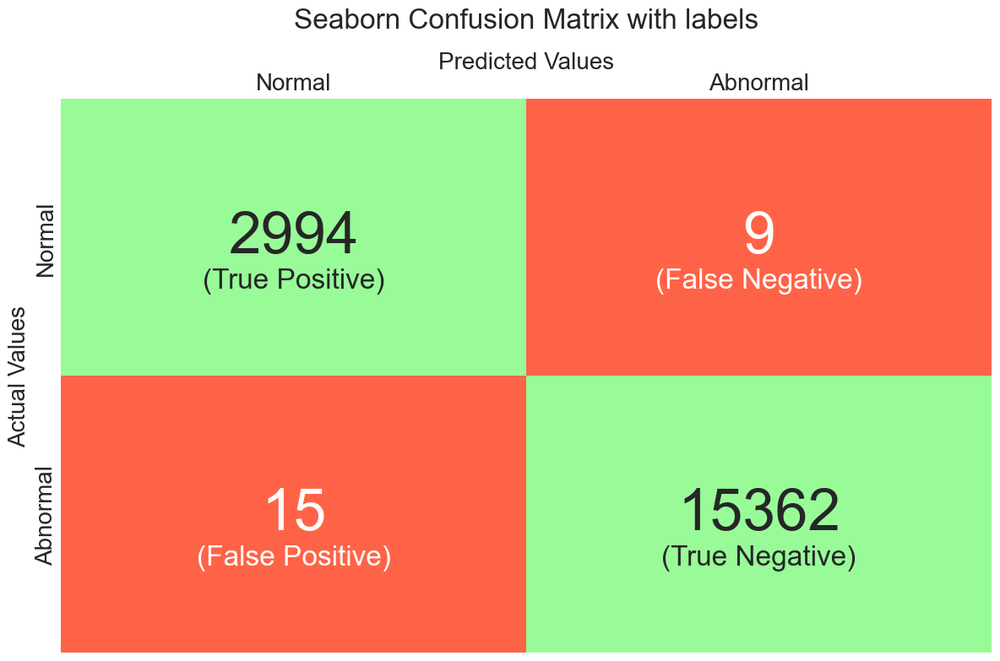

Accuracy: 0.9986942328618064 
 F1 score: 0.9960079840319361 
 Sensitivity: 0.997002997002997 
 Specificity: 0.9990245171359823 
 ROC AUC score: 0.9980137570694897 
 False Allarm Rate: 0.002997002997002997, Missed Allarm Rate: 0.0009754828640176887 
 Confusion Matrix: 
 [[ 2994     9]
 [   15 15362]] 
 Classification Report: 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      3003
           1       1.00      1.00      1.00     15377

    accuracy                           1.00     18380
   macro avg       1.00      1.00      1.00     18380
weighted avg       1.00      1.00      1.00     18380
 



In [478]:
from time import sleep

y_preds = []
for i, recon_error in enumerate(reconstruction_errors):
    
    if recon_error > best_th:
        y_preds.append(1)
    else:
        y_preds.append(0)
                
    y = all_y[i]
        
metrics, to_print = validate_model(all_y, y_preds)
auc_score = metrics["auc_score"]
print(to_print)

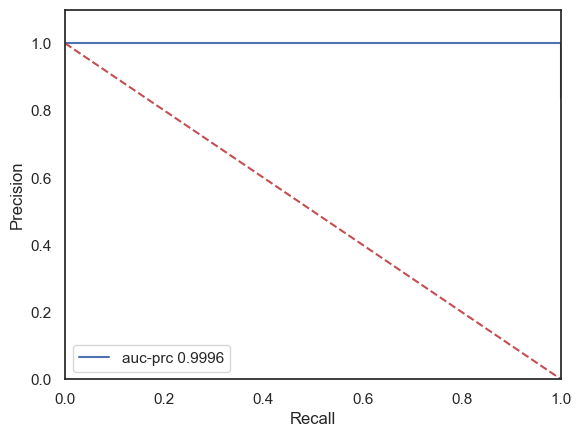

In [479]:
from sklearn.metrics import PrecisionRecallDisplay, precision_recall_curve

prec, recall, _ = precision_recall_curve(all_y, y_preds)
auc_pr = auc(recall, prec)
pr_display = PrecisionRecallDisplay(precision=prec, recall=recall).plot(label="auc-prc {}".format(round(auc_pr, 4)))
plt.plot([0, 1], [1, 0], "--r")
plt.xlim([0, 1])
plt.ylim([0, 1.1])
plt.legend()

In [480]:
y_preds_patient = {}
patients_missclassified = []
recons_all = {}
signal_all = {} 
normal_mse_patient = []
abnormal_mse_patient = []
recon_error_patient = {}

for i, (patient_signal, w) in enumerate(map_windows.items()):
    print(i+1, "/", len(map_windows.keys()), patient, end="\r")
    windows = all_windows[w] 
    windows = torch.unsqueeze(windows, dim = 1)
    test = y_all_patient[patient_signal]
    recons_signal, pred, recon_error  = isSignalAnomalous(patient_signal, windows, best_th, test, n_anomalies_th = 2) 
    patient = patient_signal.split("/")[0]
    signal = patient_signal.split("/")[1]
    recon_error_patient[patient_signal] = recon_error
    signals_all[patient_signal] = signals[patient][signal]
    recons_all[patient_signal] = recons_signal
    y_preds_patient[patient_signal] = pred
    #print(y_preds_patient)
    if test != pred:
        patients_missclassified.append(patient_signal)
    if test == 0:
        normal_mse_patient.append(recon_error)
    else:
        abnormal_mse_patient.append(recon_error)
        

Patient: patient235/s0461_re.dat Target: 0 Prediction:  0 Windows label: [0] Windows counts: [38]
Patient: patient169/s0329lre.dat Target: 0 Prediction:  0 Windows label: [0] Windows counts: [37]
Patient: patient248/s0481_re.dat Target: 0 Prediction:  0 Windows label: [0] Windows counts: [38]
Patient: patient174/s0325lre.dat Target: 0 Prediction:  0 Windows label: [0] Windows counts: [37]
Patient: patient156/s0299lre.dat Target: 0 Prediction:  0 Windows label: [0] Windows counts: [37]
Patient: patient234/s0460_re.dat Target: 0 Prediction:  0 Windows label: [0] Windows counts: [38]
Patient: patient236/s0463_re.dat Target: 0 Prediction:  1 Windows label: [0 1] Windows counts: [36  2]
Patient: patient276/s0526_re.dat Target: 0 Prediction:  0 Windows label: [0] Windows counts: [38]
Patient: patient155/s0301lre.dat Target: 0 Prediction:  0 Windows label: [0] Windows counts: [37]
Patient: patient260/s0496_re.dat Target: 0 Prediction:  0 Windows label: [0] Windows counts: [38]
Patient: patien

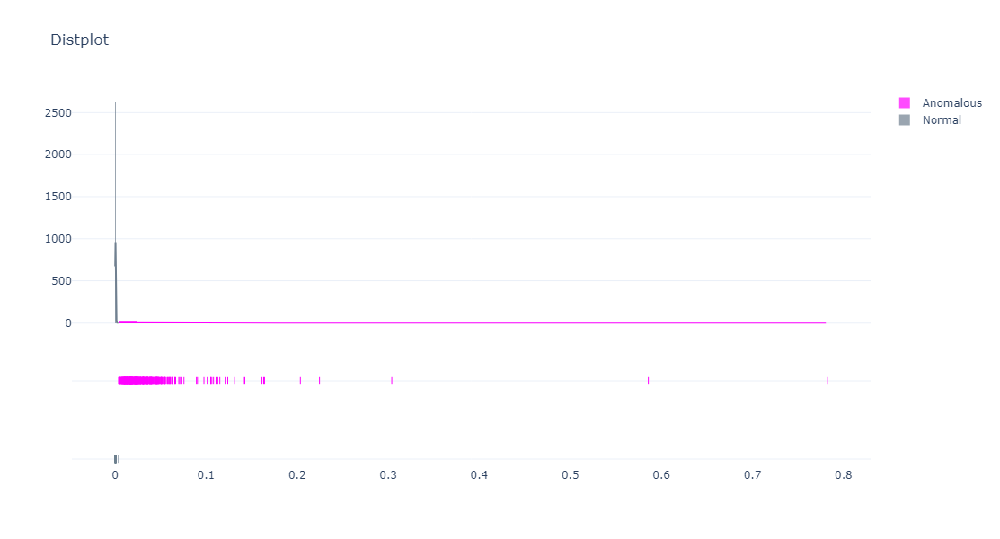

In [482]:
group_labels = ['Normal', 'Anomalous']

colors = ['slategray', 'magenta']

# Create distplot with curve_type set to 'normal'
fig = ff.create_distplot([normal_mse_patient, abnormal_mse_patient], group_labels, bin_size=.0,
                         curve_type='normal', # override default 'kde'
                         colors=colors)
fig.update_layout(title_text='Distplot', template = "plotly_white", height = 600, width = 1200)
fig.show()

In [483]:
y_test_f = []
y_preds_f = []

for patient, test in y_all_patient.items():

    pred = y_preds_patient[patient]
    y_test_f.append(test)
    y_preds_f.append(pred)

Text(0.002290000000000006, 250, 'TP')

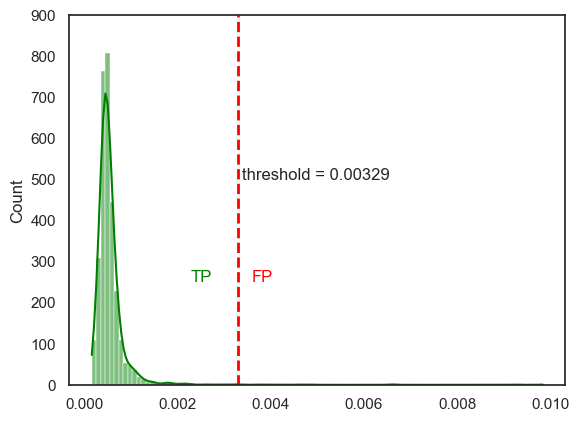

In [561]:
sns.histplot(normal_mse, kde=True, 
             bins=100, color = 'green')
plt.vlines(x = best_th, ymin = 0, ymax = 900, color = "red", linewidth = 2, linestyles = "dashed")
plt.ylim([0, 900])
plt.text(x = best_th + 0.0001, y = 500, s = "threshold = {}".format(round(best_th, 6)))
plt.text(x = best_th + 0.0003, y = 250, s = "FP", color = "red")
plt.text(x = best_th - 0.001, y = 250, s = "TP", color = "green")

Text(-0.04170999999999999, 2150, 'FN')

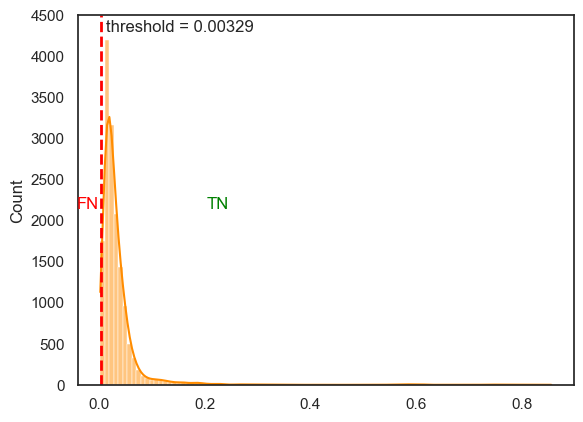

In [571]:
sns.histplot(anomalous_mse, kde=True, 
             bins=100, color = 'darkorange')
plt.vlines(x = best_th, ymin = 0, ymax = 4500, color = "red", linewidth = 2, linestyles = "dashed")
plt.ylim([0, 4500])
plt.text(x = best_th + 0.01, y = 4300, s = "threshold = {}".format(round(best_th, 6)))
plt.text(x = best_th + 0.2, y = 2150, s = "TN", color = "green")
plt.text(x = best_th - 0.045, y = 2150, s = "FN", color = "red")

In [493]:
len(y_preds_f), len(y_test_f)

(522, 522)

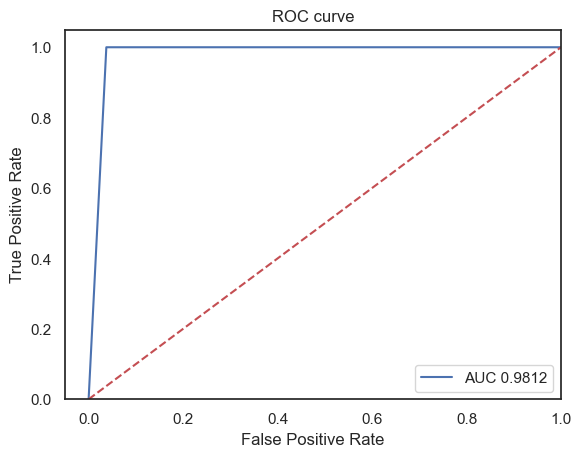

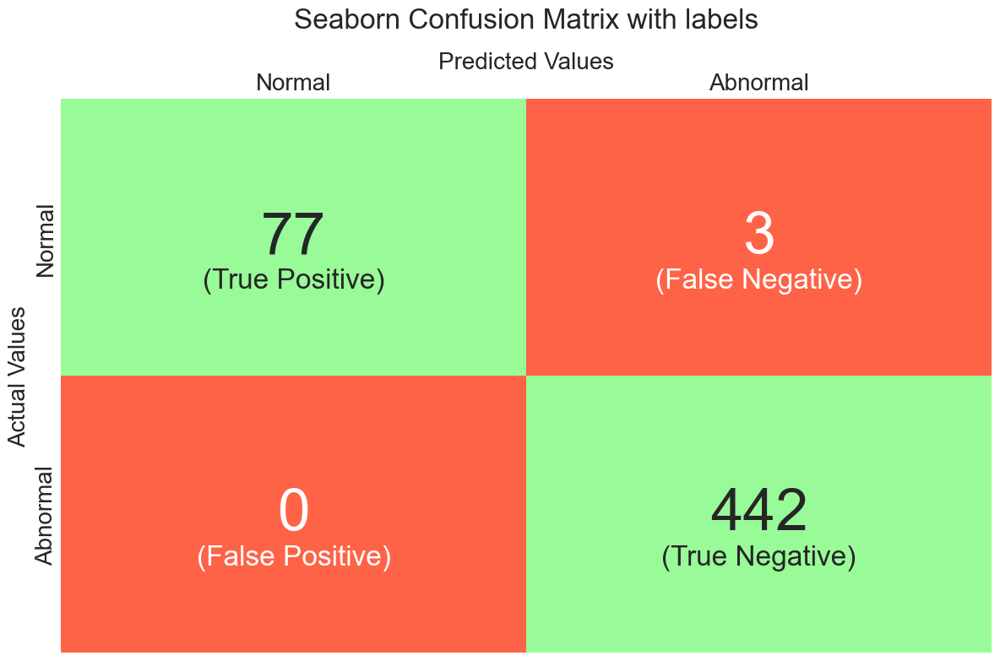

Accuracy: 0.9942528735632183 
 F1 score: 0.9808917197452229 
 Sensitivity: 0.9625 
 Specificity: 1.0 
 ROC AUC score: 0.9812500000000001 
 False Allarm Rate: 0.0375, Missed Allarm Rate: 0.0 
 Confusion Matrix: 
 [[ 77   3]
 [  0 442]] 
 Classification Report: 
               precision    recall  f1-score   support

           0       1.00      0.96      0.98        80
           1       0.99      1.00      1.00       442

    accuracy                           0.99       522
   macro avg       1.00      0.98      0.99       522
weighted avg       0.99      0.99      0.99       522
 



In [494]:
rocauc, to_print = validate_model(y_test_f, y_preds_f)
print(to_print)#0.8395079185520362

In [244]:
y_missclassified = {}
for patient_signal in patients_missclassified:
    patient = patient_signal.split("/")[0]
    signal = patient_signal.split("/")[1]
    true = y_patients[patient][signal]
    y_missclassified[patient_signal] = true
y_missclassified

{'patient236/s0463_re.dat': 'Healthy control',
 'patient251/s0486_re.dat': 'Healthy control',
 'patient150/s0287lre.dat': 'Healthy control'}

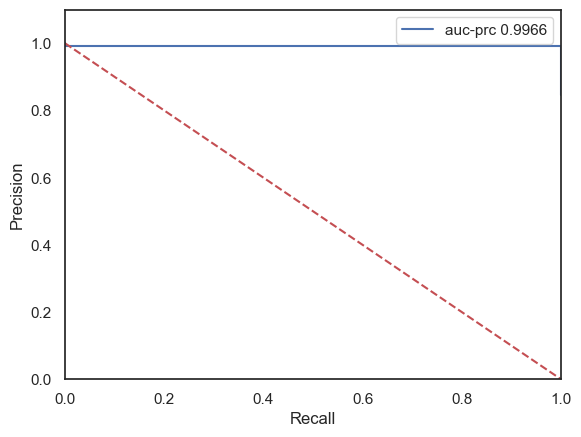

In [495]:
from sklearn.metrics import PrecisionRecallDisplay, precision_recall_curve

prec, recall, _ = precision_recall_curve(y_test_f, y_preds_f)
auc_pr = auc(recall, prec)
pr_display = PrecisionRecallDisplay(precision=prec, recall=recall).plot(label="auc-prc {}".format(round(auc_pr, 4)))
plt.plot([0, 1], [1, 0], "--r")
plt.xlim([0, 1])
plt.ylim([0, 1.1])
plt.legend()

In [496]:
import plotly.figure_factory as ff
import numpy as np


group_labels = ['Normal', 'Anomalous']

colors = ['slategray', 'magenta']

# Create distplot with curve_type set to 'normal'
fig = ff.create_distplot([normal_mse, anomalous_mse], group_labels, bin_size=.5,
                         curve_type='normal', # override default 'kde'
                         colors=colors)

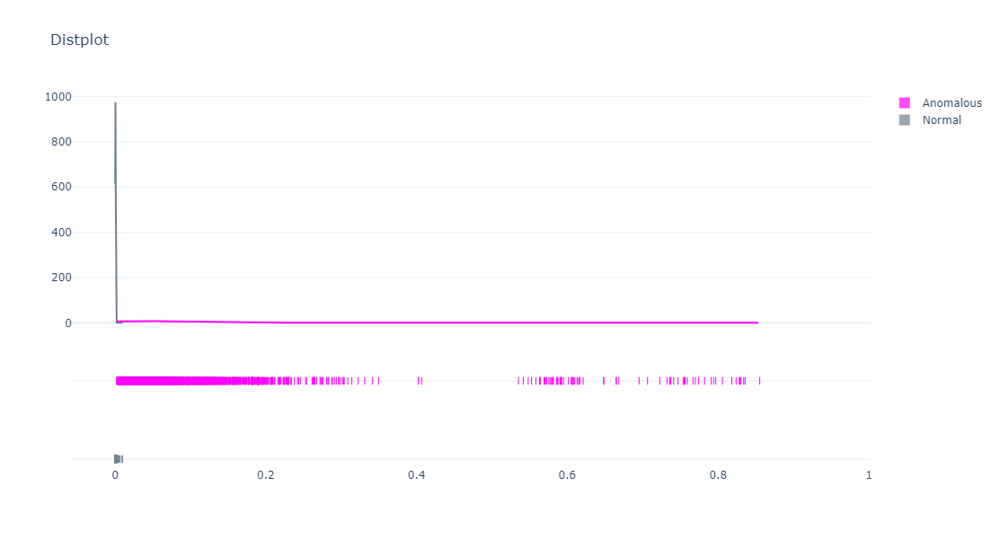

In [497]:
fig.update_layout(title_text='Distplot', template = "plotly_white", height = 600, width = 1200)
fig.show()

In [498]:
def read_all_diagnose(patient, signal):
    
    path = os.getcwd()+os.sep+"ptb-diagnostic-ecg-database-1.0.0"+os.sep
    filename = path + patient+os.sep+signal[:-4]+".hea"
    with open(filename, "r") as file:
        lines = file.readlines()
        lines = lines[18:32]  
        
    all_diagnose = ""
    for line in lines:
        all_diagnose+= line
    return all_diagnose

Patient: patient236/s0463_re.dat Target: 0 Prediction:  1 Windows label: [0 1] Windows counts: [36  2]
Patient: patient236, Signal: s0463_re.dat, Target: 0, Prediction: 1, Diagnose: 
# sex: female
# ECG date: 17/10/1996

# Diagnose:
# Reason for admission: Healthy control
# Acute infarction (localization): no
# Former infarction (localization): no
# Additional diagnoses: no
# Smoker: unknown
# Number of coronary vessels involved: unknown
# Infarction date (acute): n/a
# Previous infarction (1) date: n/a
# Previous infarction (2) date: n/a

 



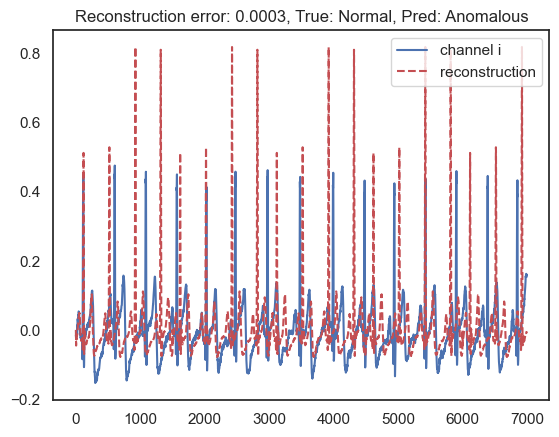

Patient: patient251/s0486_re.dat Target: 0 Prediction:  1 Windows label: [0 1] Windows counts: [35  3]
Patient: patient251, Signal: s0486_re.dat, Target: 0, Prediction: 1, Diagnose: 
# sex: male
# ECG date: 21/02/1997

# Diagnose:
# Reason for admission: Healthy control
# Acute infarction (localization): no
# Former infarction (localization): no
# Additional diagnoses: no
# Smoker: unknown
# Number of coronary vessels involved: unknown
# Infarction date (acute): n/a
# Previous infarction (1) date: n/a
# Previous infarction (2) date: n/a

 



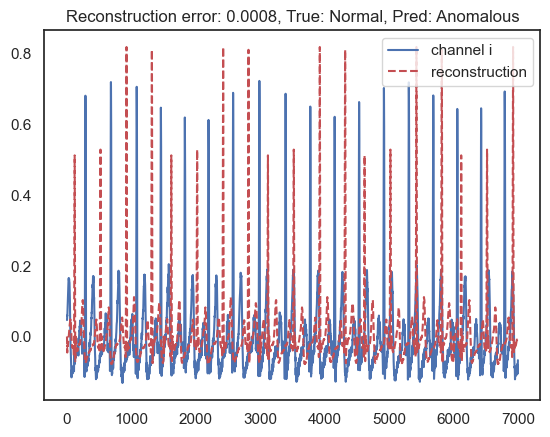

Patient: patient150/s0287lre.dat Target: 0 Prediction:  1 Windows label: [0 1] Windows counts: [35  2]
Patient: patient150, Signal: s0287lre.dat, Target: 0, Prediction: 1, Diagnose: 
# sex: male
# ECG date: 27/03/1992

# Diagnose:
# Reason for admission: Healthy control
# Acute infarction (localization): no
# Former infarction (localization): no
# Additional diagnoses: no
# Smoker: unknown
# Number of coronary vessels involved: unknown
# Infarction date (acute): n/a
# Previous infarction (1) date: n/a
# Previous infarction (2) date: n/a

 



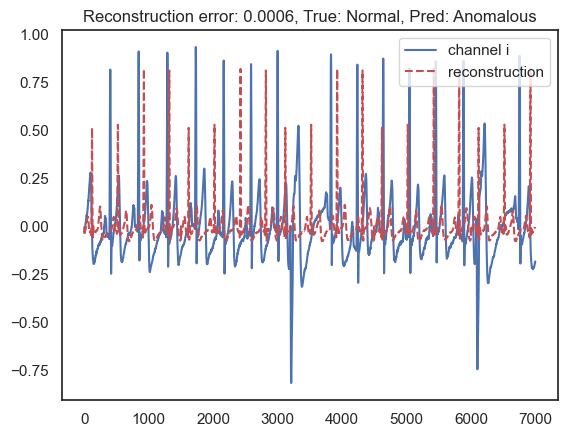

In [499]:
for patient_signal in patients_missclassified:
    patient = patient_signal.split("/")[0]
    signal = patient_signal.split("/")[1]
    test = y_all_patient[patient_signal]
    w = map_windows[patient_signal]
    windows = all_windows[w]
    windows = torch.unsqueeze(windows, dim = 1)
    recons_signal, pred, recon_error  = isSignalAnomalous(patient_signal, windows, best_th, test, n_anomalies_th = 1) 
    all_diagnose = read_all_diagnose(patient, signal)
    print("Patient: {}, Signal: {}, Target: {}, Prediction: {}, Diagnose: \n{} \n".format(patient, signal, test, pred, all_diagnose))
    signal = signals[patient][signal].T
    plt.plot(signal[0, 3000:10000], label = "channel {}".format(channels[0]))
    plt.plot(recons_signal[0, 3000:10000].cpu().detach().numpy(), "--r", label = "reconstruction")
    plt.title("Reconstruction error: {}, True: {}, Pred: {}".format(round(recon_error , 4), map_y_final[test], map_y_final[pred]))
    plt.legend(loc="upper right")
    plt.show()

Text(0.002290000000000006, 7, 'TP')

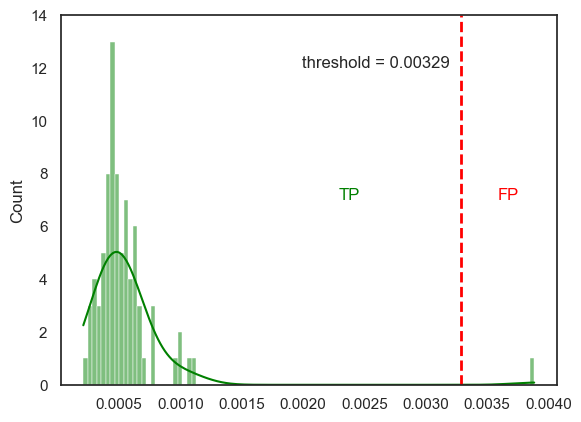

In [535]:
sns.histplot(normal_mse_patient, kde=True, 
             bins=100, color = 'green')
plt.vlines(x = best_th, ymin = 0, ymax = 14, color = "red", linewidth = 2, linestyles = "dashed")
plt.ylim([0, 14])
plt.text(x = best_th - 0.0013, y = 12, s = "threshold = {}".format(round(best_th, 6)))
plt.text(x = best_th + 0.0003, y = 7, s = "FP", color = "red")
plt.text(x = best_th - 0.001, y = 7, s = "TP", color = "green")

Text(-0.03670999999999999, 52.5, 'FN')

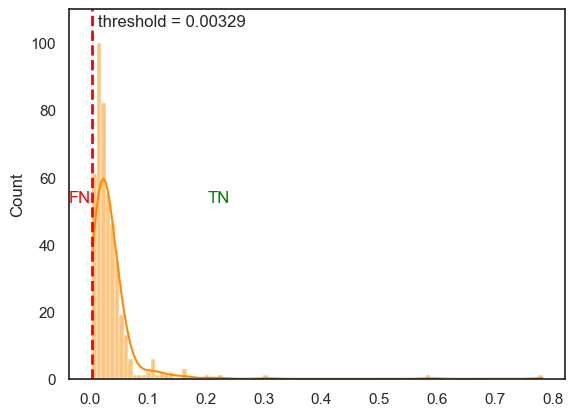

In [547]:
sns.histplot(abnormal_mse_patient, kde=True, 
             bins=100, color = 'darkorange')
plt.vlines(x = best_th, ymin = 0, ymax = 110, color = "red", linewidth = 2, linestyles = "dashed")
plt.ylim([0, 110])
plt.text(x = best_th + 0.01, y = 105, s = "threshold = {}".format(round(best_th, 6)))
plt.text(x = best_th + 0.2, y = 52.5, s = "TN", color = "green")
plt.text(x = best_th - 0.04, y = 52.5, s = "FN", color = "red")

In [548]:
y_preds_patient = {}
patients_missclassified = []
signals_all = {}
recons_all = {}
recon_error_patients = {}
normal_mse_patient = []
abnormal_mse_patient = []
for i, (patient_signal, w) in enumerate(map_windows_test.items()):
    print(i+1, "/", len(map_windows_test.keys()), end="\r")
    windows = windows_test[w] 
    test = y_test_patient[patient_signal]
    recons_signal, pred, recon_error = isSignalAnomalous(patient_signal, windows, 0.007, test, n_anomalies_th = 1) 
    recons_all[patient_signal] = recons_signal
    patient = patient_signal.split("/")[0]
    signal = patient_signal.split("/")[1]
    recon_error_patients[patient_signal] = recon_error
    signals_all[patient_signal] = signals[patient][signal]
    y_preds_patient[patient_signal] = pred
    if test != pred:
        patients_missclassified.append(patients)
    if test == 0:
        normal_mse_patient.append(recon_error)
    else:
        abnormal_mse_patient.append(recon_error)

Patient: patient233/s0483_re.dat Target: 0 Prediction:  0 Windows label: [0] Windows counts: [38]
Patient: patient236/s0462_re.dat Target: 0 Prediction:  0 Windows label: [0] Windows counts: [37]
Patient: patient233/s0482_re.dat Target: 0 Prediction:  0 Windows label: [0] Windows counts: [38]
Patient: patient242/s0471_re.dat Target: 0 Prediction:  0 Windows label: [0] Windows counts: [38]
Patient: patient245/s0474_re.dat Target: 0 Prediction:  0 Windows label: [0] Windows counts: [38]
Patient: patient263/s0499_re.dat Target: 0 Prediction:  0 Windows label: [0] Windows counts: [38]
Patient: patient150/s0287lre.dat Target: 0 Prediction:  0 Windows label: [0] Windows counts: [37]
Patient: patient233/s0459_re.dat Target: 0 Prediction:  0 Windows label: [0] Windows counts: [38]
Patient: patient131/s0273lre.dat Target: 0 Prediction:  0 Windows label: [0] Windows counts: [37]
Patient: patient237/s0465_re.dat Target: 0 Prediction:  0 Windows label: [0] Windows counts: [38]
Patient: patient279/

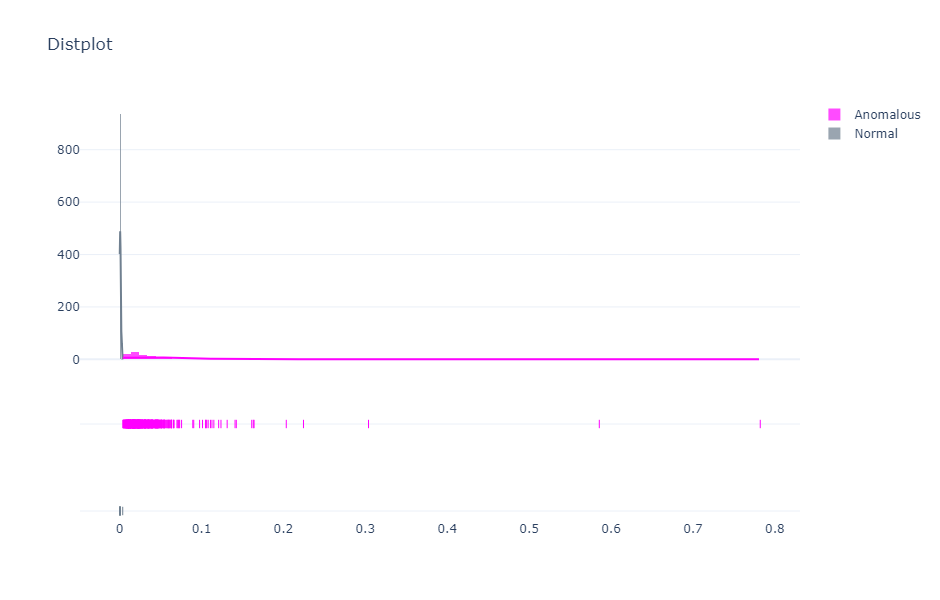

In [549]:
group_labels = ['Normal', 'Anomalous']

colors = ['slategray', 'magenta']

# Create distplot with curve_type set to 'normal'
fig = ff.create_distplot([normal_mse_patient, abnormal_mse_patient], group_labels, bin_size=.0,
                         curve_type='normal', # override default 'kde'
                         colors=colors)
fig.update_layout(title_text='Distplot', template = "plotly_white", height = 600, width = 1200)
fig.show()

In [550]:
y_test_f = []
y_preds_f = []

for patient, test in y_test_patient.items():

    pred = y_preds_patient[patient]
    y_test_f.append(test)
    y_preds_f.append(pred)

In [551]:
len(y_preds_f), len(y_test_f)

(458, 458)

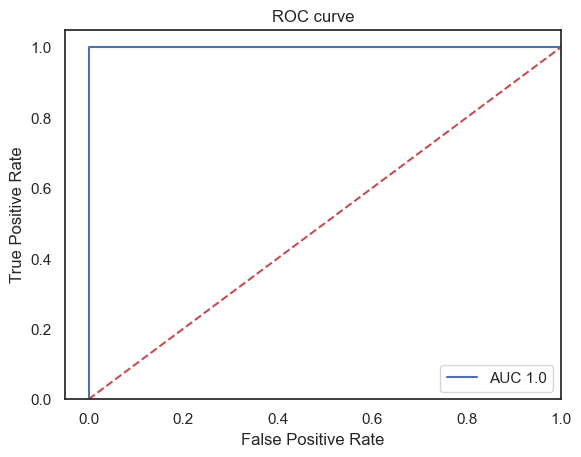

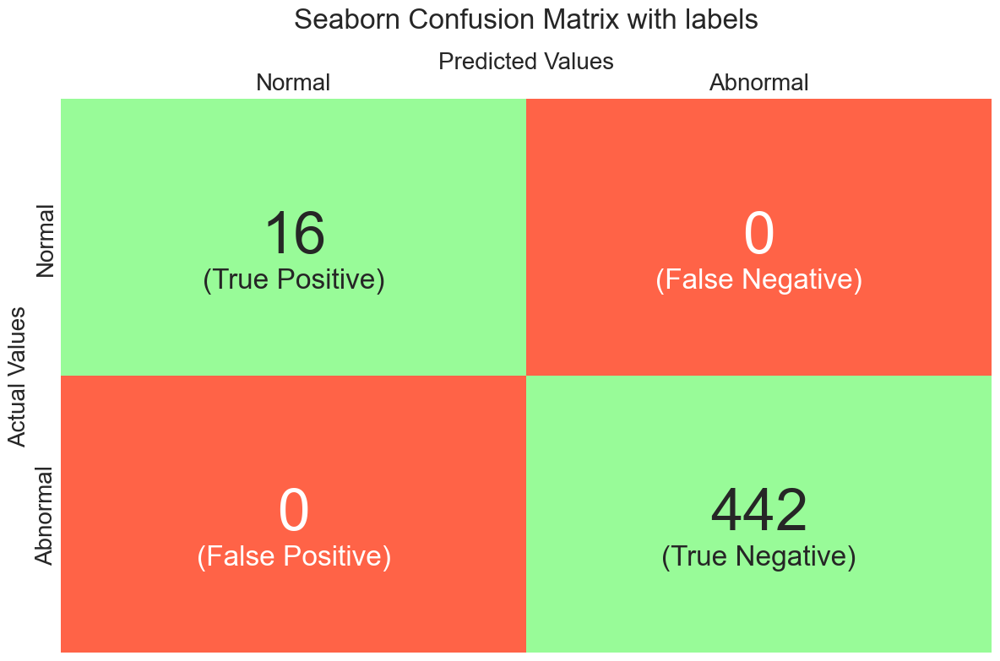

Accuracy: 1.0 
 F1 score: 1.0 
 Sensitivity: 1.0 
 Specificity: 1.0 
 ROC AUC score: 1.0 
 False Allarm Rate: 0.0, Missed Allarm Rate: 0.0 
 Confusion Matrix: 
 [[ 16   0]
 [  0 442]] 
 Classification Report: 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00        16
           1       1.00      1.00      1.00       442

    accuracy                           1.00       458
   macro avg       1.00      1.00      1.00       458
weighted avg       1.00      1.00      1.00       458
 



In [552]:
rocauc, to_print = validate_model(y_test_f, y_preds_f)
print(to_print)

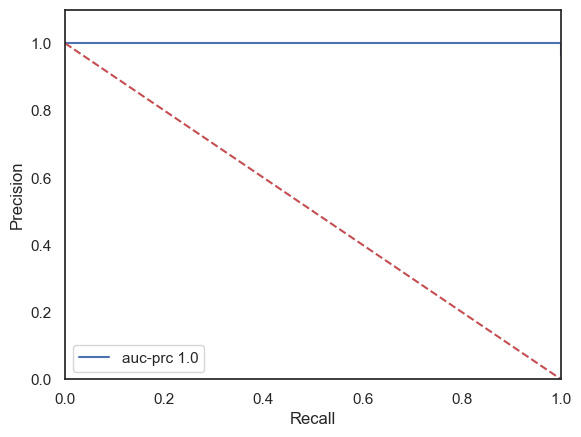

In [553]:
from sklearn.metrics import PrecisionRecallDisplay, precision_recall_curve

prec, recall, _ = precision_recall_curve(y_test_f, y_preds_f)
auc_pr = auc(recall, prec)
pr_display = PrecisionRecallDisplay(precision=prec, recall=recall).plot(label="auc-prc {}".format(round(auc_pr, 4)))
plt.plot([0, 1], [1, 0], "--r")
plt.xlim([0, 1])
plt.ylim([0, 1.1])
plt.legend()

In [575]:
if torch.cuda.is_available():
    model_s = dpnet_loader.load() #load auto encoder model
else:
    model_s = dpnet_loader.load_cpu()

In [576]:
from torch.functional import F 

fs = 500 
nchs = 15 
n_record = 2000
interval2 = 1500
interval = 2000
reconstruction_errors = []
n = all_windows.shape[0]

for i, batch_data in enumerate(all_windows): 
    
    #print(batch_data.shape)
    batch_data = torch.unsqueeze(batch_data, dim = 0).to(device)
    batch_data = torch.unsqueeze(batch_data, dim = 0)
    #print(batch_data.shape)
    reconstruction_all = np.zeros((nchs, n_record))        

    with torch.no_grad():

        reconstruction = model_s(batch_data)
        reconstruction_error = F.mse_loss(reconstruction[0, 0, :, :interval2], batch_data[0, 0, :, :interval2]).item()
        print(i+1, "/", n, "Recon error:", round(reconstruction_error, 6), end = "\r")
        reconstruction_errors.append(reconstruction_error)
        recon_np = (reconstruction[0, 0, :, :interval].cpu().detach().numpy()).reshape(1, nchs, interval)
        reconstruction_all[:, :] = recon_np[0, :, :interval]

        torch.cuda.empty_cache()

In [577]:
len(reconstruction_errors)

18380

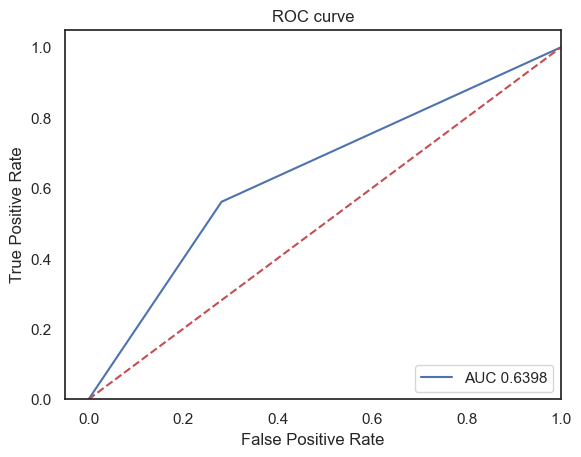

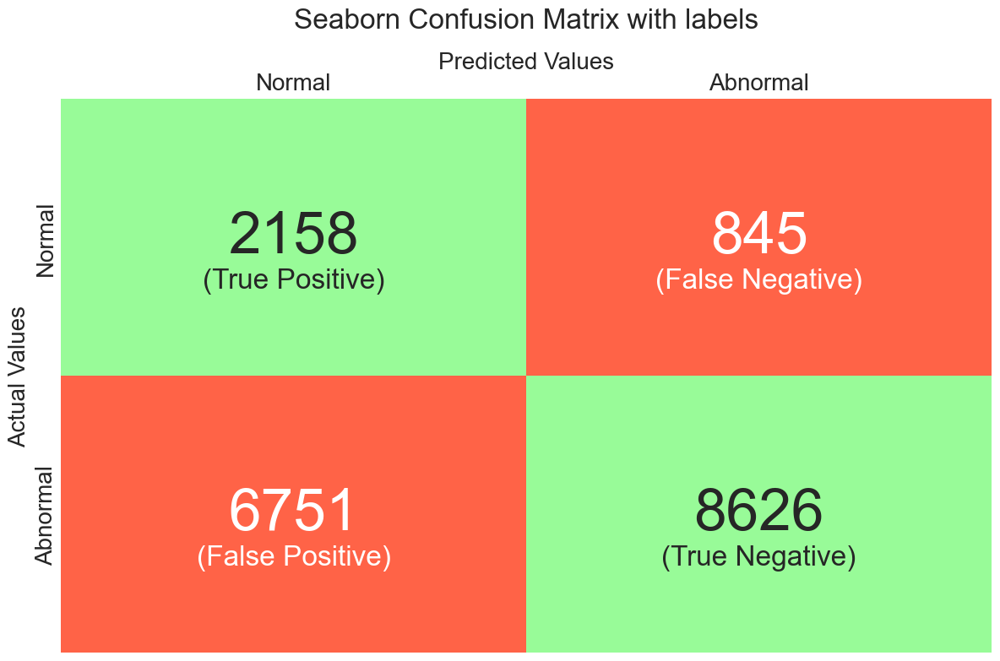

In [578]:
from time import sleep
best_th = 0.0
best_auc = 0.0
normal_mse = []
anomalous_mse = []
count_decr = 0 

thresholds = np.arange(0.003, 0.1, 0.0005)
for j, threshold in enumerate(thresholds):
    print(threshold)
    y_preds = []
    for i, recon_error in enumerate(reconstruction_errors):

        if j == 0:
            if all_y[i] == 0:
                normal_mse.append(recon_error)
            else:
                anomalous_mse.append(recon_error)

        if recon_error > threshold:
            y_preds.append(1)
        else:
            y_preds.append(0)
                
        y = all_y[i]
        
    sleep(0.5)
    clear_output(wait = True)
    metrics, to_print = validate_model(all_y, y_preds)
    auc_score = metrics["auc_score"]
    if auc_score > best_auc:
        best_th = threshold
        best_auc = auc_score
    if auc_score < best_auc:
        count_decr += 1
    if count_decr >= 10: 
        break
    print(to_print)

In [579]:
best_th, best_auc#(0.01, 0.82336)

(0.0225, 0.65323104417206)

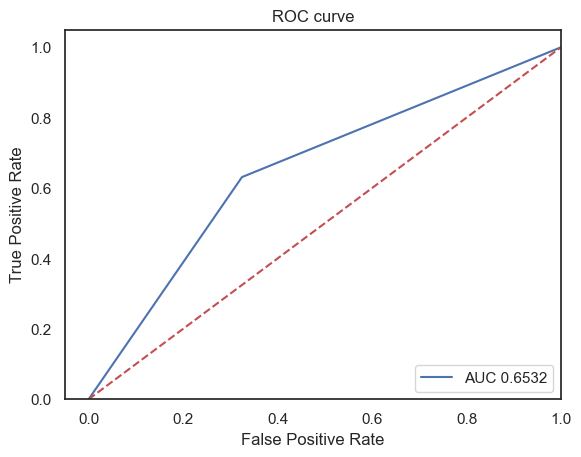

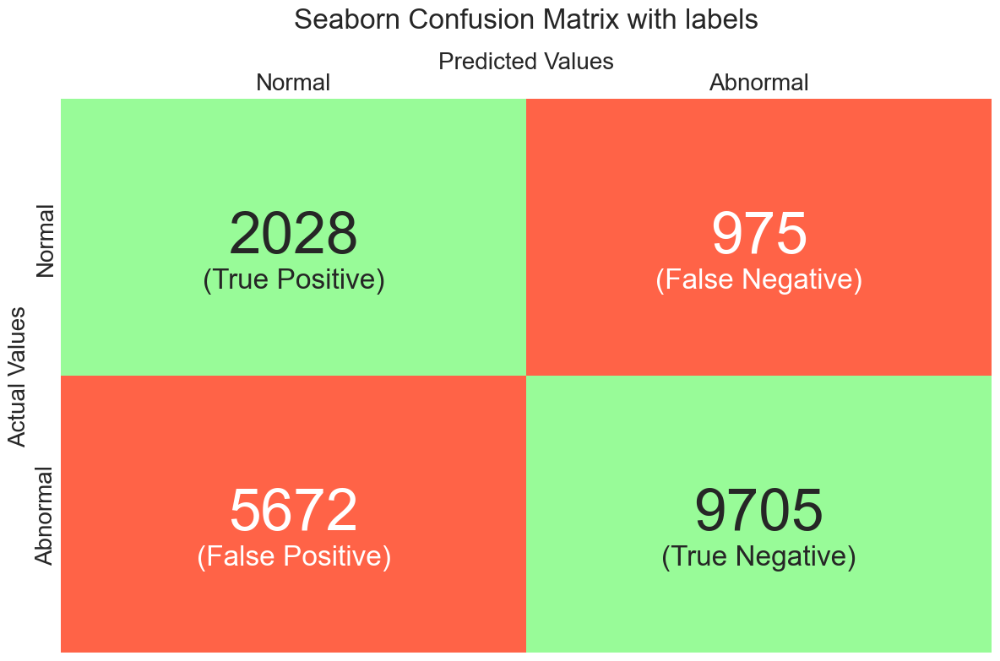

Accuracy: 0.6383569096844396 
 F1 score: 0.37895917032607673 
 Sensitivity: 0.6753246753246753 
 Specificity: 0.6311374130194446 
 ROC AUC score: 0.65323104417206 
 False Allarm Rate: 0.3246753246753247, Missed Allarm Rate: 0.36886258698055535 
 Confusion Matrix: 
 [[2028  975]
 [5672 9705]] 
 Classification Report: 
               precision    recall  f1-score   support

           0       0.26      0.68      0.38      3003
           1       0.91      0.63      0.74     15377

    accuracy                           0.64     18380
   macro avg       0.59      0.65      0.56     18380
weighted avg       0.80      0.64      0.69     18380
 



In [580]:
from time import sleep

y_preds = []
for i, recon_error in enumerate(reconstruction_errors):
    
    if recon_error > best_th:
        y_preds.append(1)
    else:
        y_preds.append(0)
                
    y = all_y[i]
        
metrics, to_print = validate_model(all_y, y_preds)
auc_score = metrics["auc_score"]
print(to_print)

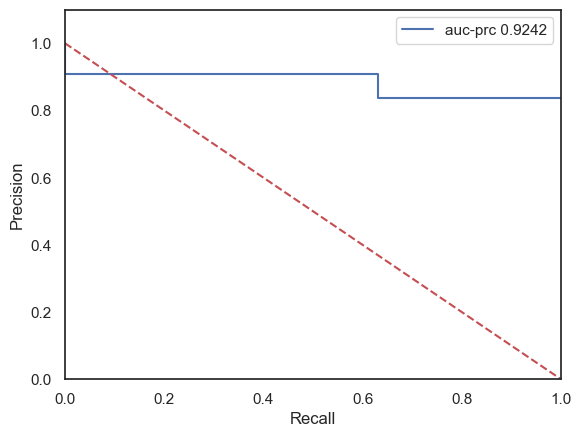

In [581]:
from sklearn.metrics import PrecisionRecallDisplay, precision_recall_curve

prec, recall, _ = precision_recall_curve(all_y, y_preds)
auc_pr = auc(recall, prec)
pr_display = PrecisionRecallDisplay(precision=prec, recall=recall).plot(label="auc-prc {}".format(round(auc_pr, 4)))
plt.plot([0, 1], [1, 0], "--r")
plt.xlim([0, 1])
plt.ylim([0, 1.1])
plt.legend()

In [582]:
y_preds_patient = {}
patients_missclassified = []
recons_all = {}
signal_all = {} 
normal_mse_patient = []
abnormal_mse_patient = []
recon_error_patient = {}

for i, (patient_signal, w) in enumerate(map_windows.items()):
    print(i+1, "/", len(map_windows.keys()), patient, end="\r")
    windows = all_windows[w] 
    windows = torch.unsqueeze(windows, dim = 1)
    test = y_all_patient[patient_signal]
    recons_signal, pred, recon_error  = isSignalAnomalous(patient_signal, windows, best_th, test, n_anomalies_th = 1, model = model_s) 
    patient = patient_signal.split("/")[0]
    signal = patient_signal.split("/")[1]
    recon_error_patient[patient_signal] = recon_error
    signals_all[patient_signal] = signals[patient][signal]
    recons_all[patient_signal] = recons_signal
    y_preds_patient[patient_signal] = pred
    #print(y_preds_patient)
    if test != pred:
        patients_missclassified.append(patient_signal)
    if test == 0:
        normal_mse_patient.append(recon_error)
    else:
        abnormal_mse_patient.append(recon_error)
        

Patient: patient235/s0461_re.dat Target: 0 Prediction:  0 Windows label: [0] Windows counts: [38]
Patient: patient169/s0329lre.dat Target: 0 Prediction:  0 Windows label: [0] Windows counts: [37]
Patient: patient248/s0481_re.dat Target: 0 Prediction:  1 Windows label: [1] Windows counts: [38]
Patient: patient174/s0325lre.dat Target: 0 Prediction:  0 Windows label: [0] Windows counts: [37]
Patient: patient156/s0299lre.dat Target: 0 Prediction:  1 Windows label: [1] Windows counts: [37]
Patient: patient234/s0460_re.dat Target: 0 Prediction:  0 Windows label: [0] Windows counts: [38]
Patient: patient236/s0463_re.dat Target: 0 Prediction:  1 Windows label: [0 1] Windows counts: [35  3]
Patient: patient276/s0526_re.dat Target: 0 Prediction:  1 Windows label: [0 1] Windows counts: [ 1 37]
Patient: patient155/s0301lre.dat Target: 0 Prediction:  1 Windows label: [0 1] Windows counts: [36  1]
Patient: patient260/s0496_re.dat Target: 0 Prediction:  0 Windows label: [0] Windows counts: [38]
Patie

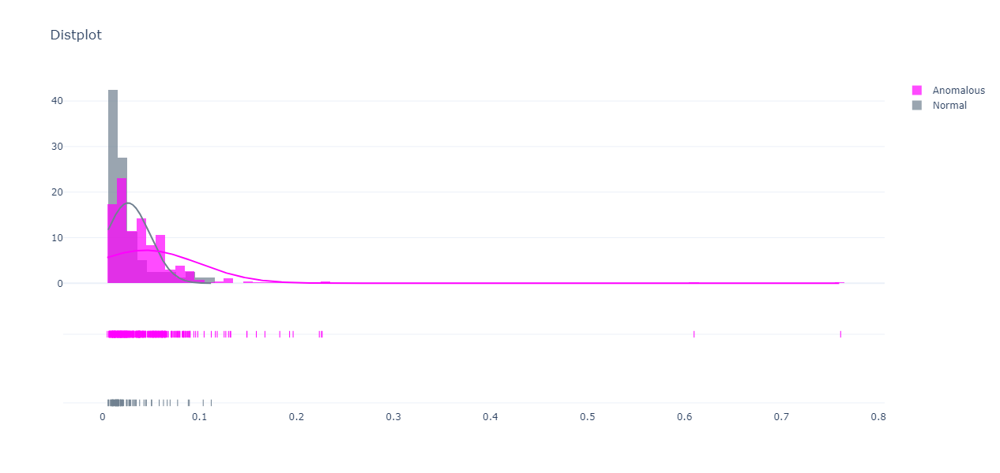

In [583]:
group_labels = ['Normal', 'Anomalous']

colors = ['slategray', 'magenta']

# Create distplot with curve_type set to 'normal'
fig = ff.create_distplot([normal_mse_patient, abnormal_mse_patient], group_labels, bin_size=.0,
                         curve_type='normal', # override default 'kde'
                         colors=colors)
fig.update_layout(title_text='Distplot', template = "plotly_white", height = 600, width = 1200)
fig.show()

In [584]:
y_test_f = []
y_preds_s = []

for patient, test in y_all_patient.items():

    pred = y_preds_patient[patient]
    y_test_f.append(test)
    y_preds_s.append(pred)

In [585]:
len(y_preds_s), len(y_test_f)

(522, 522)

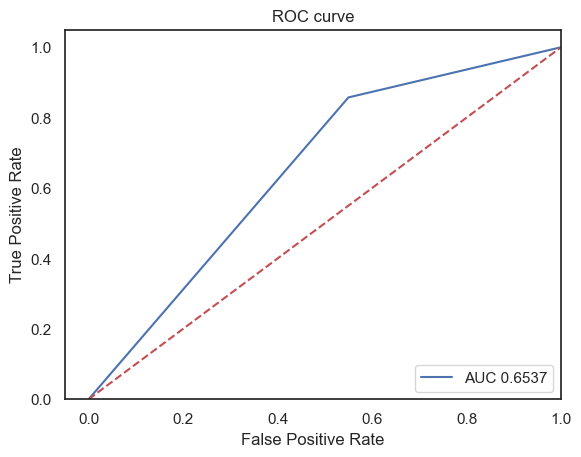

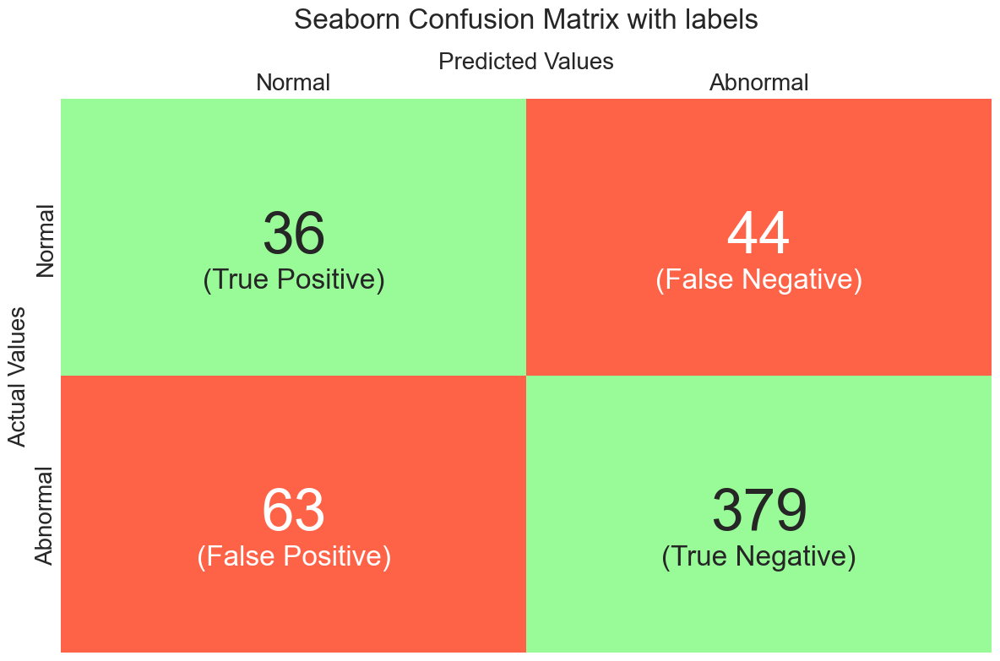

Accuracy: 0.7950191570881227 
 F1 score: 0.40223463687150834 
 Sensitivity: 0.45 
 Specificity: 0.8574660633484162 
 ROC AUC score: 0.653733031674208 
 False Allarm Rate: 0.55, Missed Allarm Rate: 0.1425339366515837 
 Confusion Matrix: 
 [[ 36  44]
 [ 63 379]] 
 Classification Report: 
               precision    recall  f1-score   support

           0       0.36      0.45      0.40        80
           1       0.90      0.86      0.88       442

    accuracy                           0.80       522
   macro avg       0.63      0.65      0.64       522
weighted avg       0.81      0.80      0.80       522
 



In [586]:
rocauc, to_print = validate_model(y_test_f, y_preds_s)
print(to_print)#0.8395079185520362

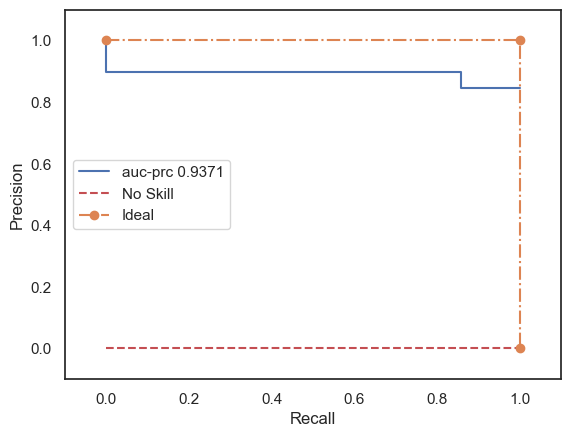

In [587]:
from sklearn.metrics import PrecisionRecallDisplay, precision_recall_curve

prec, recall, _ = precision_recall_curve(y_test_f, y_preds_s)
auc_pr = auc(recall, prec)
pr_display = PrecisionRecallDisplay(precision=prec, recall=recall).plot(label="auc-prc {}".format(round(auc_pr, 4)))
plt.plot([0, 1], [0, 0], "--r", label = "No Skill")
plt.plot([0, 1, 1], [1, 1, 0], "-.o", label = "Ideal")
plt.xlim([-0.1, 1.1])
plt.ylim([-0.1, 1.1])
plt.legend()

In [588]:
y_test_f.shape, y_preds_f.shape

AttributeError: 'list' object has no attribute 'shape'

In [ ]:
y_test_f = np.array(y_test_f)       #cast array-like in numpy array
y_preds_f = np.array(y_preds_f)
y_preds_s = np.array(y_preds_s)
labels = np.unique(y_test_f)
fpr, tpr, threshold = roc_curve(y_test_f, y_preds_f)
fpr1, tpr1, threshold1 =  roc_curve(y_test_f, y_preds_s)
#print(fpr, tpr)
roc_auc = round(auc(fpr, tpr), 4)
roc_auc1 = round(auc(fpr1, tpr1), 4)

plt.title('ROC curve')
plt.plot(fpr, tpr, 'k', label = 'real + synthetic (area {})'.format(roc_auc))
plt.plot(fpr1, tpr1, 'b', label = 'only synthetic (area {})'.format(roc_auc1))
plt.legend(loc = 'lower right')
plt.plot(labels, labels,'r--')
plt.xlim(labels)
plt.ylim(labels)
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

C:\Users\Utente\AppData\Local\Temp\ipykernel_29020\1778994578.py:8: UserWarning:

Using a target size (torch.Size([15, 2000])) that is different to the input size (torch.Size([1, 1, 15, 2000])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.



0.032075002789497375


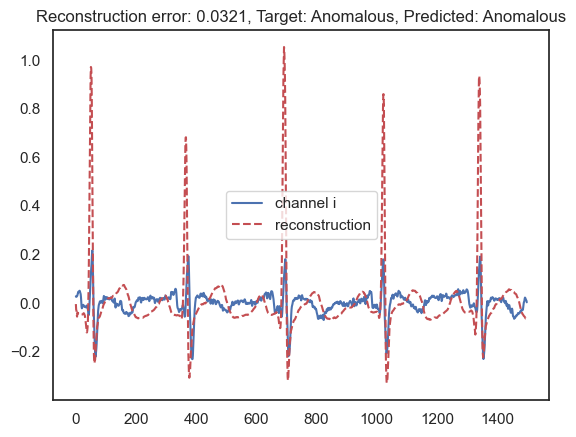

In [572]:
idx_abnormal = np.argwhere(np.array(list(y_test_patient.values())) == 1)[10][0]
patient = np.array(list(y_test_patient.keys()))[idx_abnormal]
w = map_windows[patient]
windows = all_windows[w]
x_abnormal = windows[0][:, :interval].to(device)
input = torch.unsqueeze(torch.unsqueeze(x_abnormal, dim = 0), dim = 1)
recon_abnormal = model(input)
reconstruction_error = F.mse_loss(recon_abnormal, x_abnormal).item()
if reconstruction_error >= best_th:
    pred = 1
else:
    pred = 0
y = y_test_patient[patient]
ch = 0
print(reconstruction_error)
plt.plot(x_abnormal[ch, :1500].cpu().detach().numpy(), label = "channel {}".format(channels[ch]))
plt.plot(recon_abnormal[0, 0, ch, :1500].cpu().detach().numpy(), "--r", label = "reconstruction")
plt.title("Reconstruction error: {}, Target: {}, Predicted: {}".format(round(reconstruction_error , 4), map_y_final[y],  map_y_final[pred]))
plt.legend()
plt.savefig("reconstruction_anomalous.png")

0.00487996032461524


C:\Users\Utente\AppData\Local\Temp\ipykernel_29020\1599479521.py:8: UserWarning:

Using a target size (torch.Size([15, 2000])) that is different to the input size (torch.Size([1, 1, 15, 2000])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.



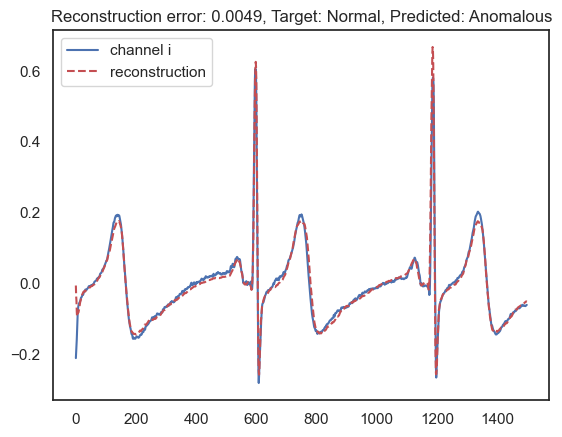

In [573]:
idx_normal = np.argwhere(np.array(list(y_test_patient.values())) == 0)[10][0]
patient = np.array(list(y_test_patient.keys()))[idx_normal]
w = map_windows[patient]
windows = all_windows[w]
x_normal = windows[0][:, :interval].to(device)
input = torch.unsqueeze(torch.unsqueeze(x_normal, dim = 0), dim = 1)
recon_normal = model(input)
reconstruction_error = F.mse_loss(recon_normal, x_normal).item()
if reconstruction_error >= best_th:
    pred = 1
else:
    pred = 0
y = y_test_patient[patient]
ch = 0
print(reconstruction_error)
plt.plot(x_normal[ch, :1500].cpu().detach().numpy(), label = "channel {}".format(channels[ch]))
plt.plot(recon_normal[0, 0, ch, :1500].cpu().detach().numpy(), "--r", label = "reconstruction")
plt.title("Reconstruction error: {}, Target: {}, Predicted: {}".format(round(reconstruction_error , 4), map_y_final[y],  map_y_final[pred]))
plt.legend()
plt.savefig("reconstruction_normal.png")